# Car Price prediction

<img src="https://whatcar.vn/media/2018/09/car-lot-940x470.jpg"/>

## Прогнозирование стоимости автомобиля по характеристикам


In [386]:
#!pip install -q tensorflow==2.3

In [387]:
#аугментации изображений
#!pip install albumentations -q

In [388]:
#!pip install pymorphy2
#!pip install -U pymorphy2-dicts-ru

In [389]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import random as rn
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import sys
import PIL
import cv2
import re
from datetime import datetime as dt
import math
import pandas_profiling

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# # keras
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import albumentations

# plt
import matplotlib.pyplot as plt
#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_selection import f_classif, mutual_info_classif
from itertools import combinations
from scipy.stats import ttest_ind

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [390]:
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)
print('Tensorflow   :', tf.__version__)

Python       : 3.7.6 | packaged by conda-forge | (default, Mar 23 2020, 23:03:20) 
Numpy        : 1.18.5
Tensorflow   : 2.3.0


In [391]:
#импорт данных
df_train = pd.read_csv('../input/sf-dst-car-price-prediction-part2/train.csv')
df_test = pd.read_csv('../input/sf-dst-car-price-prediction-part2/test.csv')
df_submit = pd.read_csv('../input/sf-dst-car-price-prediction-part2/sample_submission.csv')

pd.set_option('display.max_columns', None)
display(df_train.sample(2))

,bodyType,brand,color,description,engineDisplacement,enginePower,fuelType,mileage,modelDate,model_info,name,numberOfDoors,price,productionDate,sell_id,vehicleConfiguration,vehicleTransmission,Владельцы,Владение,ПТС,Привод,Руль
5115,внедорожник 5 дв.,BMW,синий,"Автомобиль в прекрасном состояние, полностью о...",3.0 LTR,245 N12,дизель,182000,2007,X6,30d 3.0d AT (245 л.с.) 4WD,5,1500000.0,2011,1099458618,ALLROAD_5_DOORS AUTOMATIC 3.0,автоматическая,3 или более,NaN,Оригинал,полный,Левый
1805,седан,BMW,синий,"Немецкая сборка\nПолный shadow line\nМ-пакет, ...",3.0 LTR,249 N12,дизель,58000,2016,5ER,530d xDrive 3.0d AT (249 л.с.) 4WD,4,2950000.0,2017,1099881308,SEDAN AUTOMATIC 3.0,автоматическая,2 владельца,NaN,Оригинал,полный,Левый


In [392]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6682 entries, 0 to 6681
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              6682 non-null   object 
 1   brand                 6682 non-null   object 
 2   color                 6682 non-null   object 
 3   description           6682 non-null   object 
 4   engineDisplacement    6682 non-null   object 
 5   enginePower           6682 non-null   object 
 6   fuelType              6682 non-null   object 
 7   mileage               6682 non-null   int64  
 8   modelDate             6682 non-null   int64  
 9   model_info            6682 non-null   object 
 10  name                  6682 non-null   object 
 11  numberOfDoors         6682 non-null   int64  
 12  price                 6682 non-null   float64
 13  productionDate        6682 non-null   int64  
 14  sell_id               6682 non-null   int64  
 15  vehicleConfiguration 

In [393]:
display(df_test.sample(2))

,bodyType,brand,color,description,engineDisplacement,enginePower,fuelType,mileage,modelDate,model_info,name,numberOfDoors,productionDate,sell_id,vehicleConfiguration,vehicleTransmission,Владельцы,Владение,ПТС,Привод,Руль
692,седан,BMW,чёрный,Состояние нового автомобиля. Полностью обслуже...,2.0 LTR,184 N12,бензин,140000,2013,5ER,520i 2.0 AT (184 л.с.),4,2014,1100062006,SEDAN AUTOMATIC 2.0,автоматическая,1 владелец,NaN,Оригинал,задний,Левый
1471,седан,MERCEDES,чёрный,"Комплектация максимальная! Доводчики дверей, в...",4.7 LTR,435 N12,бензин,262000,2009,S_KLASSE,500 Long 4.7 AT (435 л.с.) 4WD,4,2011,1100260544,SEDAN AUTOMATIC 4.7,автоматическая,2 владельца,NaN,Дубликат,полный,Левый


In [394]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1671 entries, 0 to 1670
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              1671 non-null   object
 1   brand                 1671 non-null   object
 2   color                 1671 non-null   object
 3   description           1671 non-null   object
 4   engineDisplacement    1671 non-null   object
 5   enginePower           1671 non-null   object
 6   fuelType              1671 non-null   object
 7   mileage               1671 non-null   int64 
 8   modelDate             1671 non-null   int64 
 9   model_info            1671 non-null   object
 10  name                  1671 non-null   object
 11  numberOfDoors         1671 non-null   int64 
 12  productionDate        1671 non-null   int64 
 13  sell_id               1671 non-null   int64 
 14  vehicleConfiguration  1671 non-null   object
 15  vehicleTransmission   1671 non-null   

In [395]:
#обьединим датасеты для совместной предобработки
df_train['Train'] = 1 # помечаем где у нас трейн
df_test['Train'] = 0 # помечаем где у нас тест
df = df_train.append(df_test, sort=False).reset_index(drop=True) # объединяем

In [396]:
#проанализируем данне
pandas_profiling.ProfileReport(df[df['Train']==1])

In [397]:
pandas_profiling.ProfileReport(df[df['Train']==0])

В тренировочной выборке 6682 строк, в тестовой 1671. Всего - 8353 строк.
Всего 23 признака, из них:


5 - числовых - mileage, modelDate, productionDate, numberOfDoors, sell_id
17 - категориальных
1 - бинарный - Train - для разделения train и test


руль -  2 строки из 6682 "правый руль", остальные "левый руль"
высокая корреляция между modelDate и productionDate
высокая корреляция между numberOfDoors и bodyType
высокая корреляция между vehicleConfiguration и vehicleTransmission
высокая корреляция между vehicleConfiguration и engineDisplacement 
sell_id вспомогательный признак


в трейне нет дубликатов по строкам
пропуски пропуски в трейне:
Владение - 4326 (64.7%)
Владельцы - 1(< 0.1%) 


пропуски в тесте:
Владение - 1092 (65.4%)




Посмотрим на типы признаков:

* bodyType - категориальный
* brand - категориальный
* color - категориальный
* description - текстовый
* engineDisplacement - числовой, представленный как текст
* enginePower - числовой, представленный как текст
* fuelType - категориальный
* mileage - числовой
* modelDate - числовой
* model_info - категориальный
* name - категориальный, желательно сократить размерность
* numberOfDoors - категориальный
* price - числовой, целевой
* productionDate - числовой
* sell_id - изображение (файл доступен по адресу, основанному на sell_id)
* vehicleConfiguration - не используется (комбинация других столбцов)
* vehicleTransmission - категориальный
* Владельцы - категориальный
* Владение - числовой, представленный как текст
* ПТС - категориальный
* Привод - категориальный
* Руль - категориальный

In [398]:
# раздели данные по типам

bin_cols = []

cat_cols = ['bodyType', 'brand', 'color', 'description', 'engineDisplacement',
       'enginePower', 'fuelType', 'model_info', 'name',
       'vehicleConfiguration', 'vehicleTransmission', 'Владельцы', 'Владение',
       'ПТС', 'Привод', 'Руль']
# числовые переменные 
num_cols = ['mileage', 'modelDate', 'productionDate', 'numberOfDoors']
# вспомогательные
servis_cols = ['Train', 'sell_id']
# целевая переменная 
target_col = ['price']

In [399]:
def svodka(d_col, d_df, auto_del=True):
    print('Количество уникальных значений')
    print(f'во всем датасете:= {d_df[d_col].nunique()}')
    temp_df_Train = d_df[d_df['Train']==1].copy()
    temp_df_Test = d_df[d_df['Train']==0].copy()
    set_Train = set(temp_df_Train[d_col].unique())
    set_Test = set(temp_df_Test[d_col].unique())
    print(f'Количество уникальных значений трейне:= {len(set_Train)}')
    print(f'Количество уникальных значений тесте:= {len(set_Test)}')
    print(f'Список уникальных значений в трейне:= {set_Train}')
    print(f'Список уникальных значений в тесте:=  {set_Test}')

    print(f'что есть в трейне и нет в тесте:= {set_Train.difference(set_Test)}')
    print(f'что есть в тесте и нет в трейне:= {set_Test.difference(set_Train)}')
    diff_list = list(set_Train.difference(set_Test))
    
    d_len_Train = len(temp_df_Train)
    if len(diff_list)>0:
        
        for uz in diff_list:
            print()
            d_len_uz = len(temp_df_Train[temp_df_Train[d_col] == uz])
            dolya = d_len_uz/d_len_Train*100
            if dolya < 0.1:
                udalit = 'можно удалить'
            else:
                udalit = ''
            print(f'\'{uz}\' в трейне := {d_len_uz} \
    ({dolya:.2f}% от трейна). {udalit}', end='')
            
        if auto_del:
            list_uz_test = list(temp_df_Test[d_col].unique())
            d_df = d_df[d_df[d_col].isin(list_uz_test)]
            print()
            print('Удаление завершено')
        
        return d_df
    else:
        print('Различий в списках уникальных значений нет.')
        return d_df

In [400]:
 #bodyType
df = svodka('bodyType', df)

Количество уникальных значений
во всем датасете:= 17
Количество уникальных значений трейне:= 17
Количество уникальных значений тесте:= 14
Список уникальных значений в трейне:= {'кабриолет', 'пикап двойная кабина', 'хэтчбек 5 дв.', 'седан', 'внедорожник открытый', 'минивэн', 'лимузин', 'внедорожник 5 дв.', 'внедорожник 3 дв.', 'купе', 'родстер', 'хэтчбек 3 дв.', 'компактвэн', 'универсал 5 дв.', 'купе-хардтоп', 'седан 2 дв.', 'лифтбек'}
Список уникальных значений в тесте:=  {'кабриолет', 'пикап двойная кабина', 'седан', 'хэтчбек 5 дв.', 'внедорожник открытый', 'минивэн', 'внедорожник 5 дв.', 'внедорожник 3 дв.', 'родстер', 'купе', 'хэтчбек 3 дв.', 'универсал 5 дв.', 'купе-хардтоп', 'лифтбек'}
что есть в трейне и нет в тесте:= {'седан 2 дв.', 'лимузин', 'компактвэн'}
что есть в тесте и нет в трейне:= set()

'седан 2 дв.' в трейне := 1     (0.01% от трейна). можно удалить
'лимузин' в трейне := 5     (0.07% от трейна). можно удалить
'компактвэн' в трейне := 8     (0.12% от трейна). 
Удалени

bodyType: Категориальный признак. 
Удалили 3 типа кузова как выбросы. 
Оставим только типы кузова из теста.

In [401]:
#df[df['bodyType']=='родстер']

In [402]:
#brand
df = svodka('brand', df)

Количество уникальных значений
во всем датасете:= 3
Количество уникальных значений трейне:= 3
Количество уникальных значений тесте:= 3
Список уникальных значений в трейне:= {'AUDI', 'BMW', 'MERCEDES'}
Список уникальных значений в тесте:=  {'AUDI', 'BMW', 'MERCEDES'}
что есть в трейне и нет в тесте:= set()
что есть в тесте и нет в трейне:= set()
Различий в списках уникальных значений нет.


In [403]:
#отображение бохплойтов параметра относительно другого
import seaborn as sns
def get_boxplot(x_column, y_column, dff):
    fig, ax = plt.subplots(figsize = (12,2))
    sns.boxplot(x=x_column, y=y_column, 
                data=dff.loc[dff.loc[:, x_column].isin(dff.loc[:, x_column].value_counts().index[:10])],
               ax=ax,orient = "h")
    plt.xticks(rotation=45)
    ax.set_title(x_column)
    plt.show() 

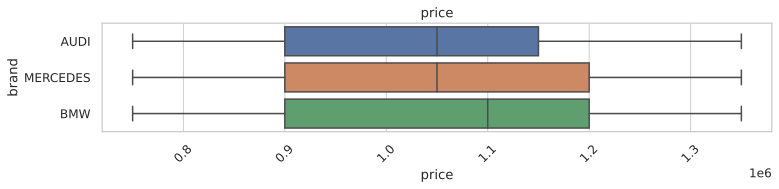

In [404]:
get_boxplot('price','brand', df_train)

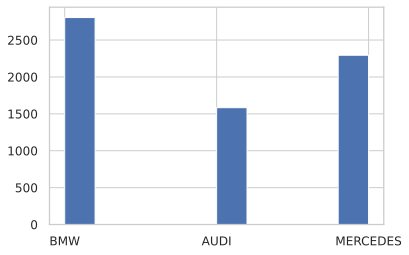

In [405]:
df_train['brand'].hist()

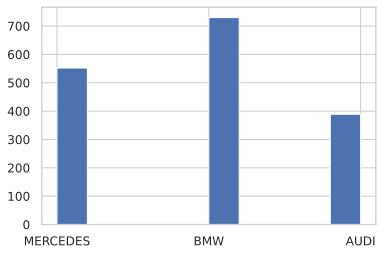

In [406]:
df_test['brand'].hist()

 brand - Категориальный признак. Три уникальных значения - AUDI, MERCEDES, BMW. Распределение марок в трейне и в тесте одинаково. 

In [407]:
df = svodka('color', df)

Количество уникальных значений
во всем датасете:= 16
Количество уникальных значений трейне:= 16
Количество уникальных значений тесте:= 15
Список уникальных значений в трейне:= {'оранжевый', 'коричневый', 'серебристый', 'бежевый', 'розовый', 'белый', 'пурпурный', 'жёлтый', 'чёрный', 'серый', 'синий', 'зелёный', 'золотистый', 'фиолетовый', 'красный', 'голубой'}
Список уникальных значений в тесте:=  {'оранжевый', 'коричневый', 'серебристый', 'бежевый', 'пурпурный', 'белый', 'жёлтый', 'чёрный', 'золотистый', 'серый', 'синий', 'красный', 'фиолетовый', 'зелёный', 'голубой'}
что есть в трейне и нет в тесте:= {'розовый'}
что есть в тесте и нет в трейне:= set()

'розовый' в трейне := 1     (0.01% от трейна). можно удалить
Удаление завершено


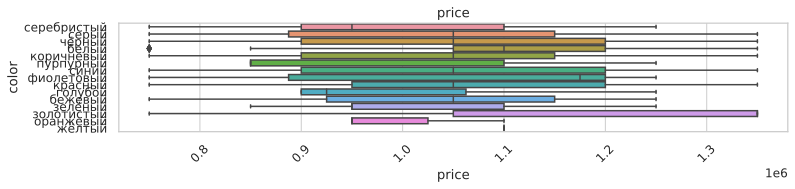

In [408]:
get_boxplot('price','color', df_train)

Золотистые машины стоят дороже.

In [409]:
df = svodka('engineDisplacement', df)

Количество уникальных значений
во всем датасете:= 48
Количество уникальных значений трейне:= 48
Количество уникальных значений тесте:= 43
Список уникальных значений в трейне:= {'4.7 LTR', '3.8 LTR', '3.6 LTR', '4.6 LTR', '2.5 LTR', '2.9 LTR', '5.5 LTR', '2.7 LTR', '2.4 LTR', '0.7 LTR', '4.4 LTR', '4.0 LTR', '3.0 LTR', '4.9 LTR', '1.2 LTR', '2.0 LTR', '2.8 LTR', '1.8 LTR', '3.1 LTR', '4.1 LTR', '3.5 LTR', '5.9 LTR', '1.9 LTR', '4.8 LTR', 'undefined LTR', '1.3 LTR', '5.8 LTR', '2.3 LTR', '2.1 LTR', '1.4 LTR', '5.2 LTR', '4.3 LTR', '5.4 LTR', '4.2 LTR', '1.6 LTR', '5.0 LTR', '6.3 LTR', '1.5 LTR', '1.7 LTR', '3.7 LTR', '6.6 LTR', '6.0 LTR', '5.6 LTR', '3.2 LTR', '2.2 LTR', '2.6 LTR', '3.4 LTR', '6.2 LTR'}
Список уникальных значений в тесте:=  {'4.7 LTR', '3.8 LTR', '3.6 LTR', '2.5 LTR', '2.9 LTR', '5.5 LTR', '2.7 LTR', '2.4 LTR', '0.7 LTR', '4.4 LTR', '4.0 LTR', '3.0 LTR', '1.2 LTR', '2.0 LTR', '1.8 LTR', '2.8 LTR', '3.1 LTR', '4.1 LTR', '3.5 LTR', '5.9 LTR', '1.9 LTR', '4.8 LTR', 'undefin

In [410]:
#в списке присутсвует значение 'undefined LTR' возможно это электрокары
temp_df_Train = df[df['Train']==1]
temp_df_Test = df[df['Train']==0]
temp_df_Train[temp_df_Train['engineDisplacement']=='undefined LTR'].fuelType.unique()

array(['электро'], dtype=object)

In [411]:
#перведем признак в числовй вид
def pars_num_from_engineDisplacement(row):
    row = str(row)
    temp_pars = re.findall('\d\.\d', row)
    
    if temp_pars == []:
        return None  
    else:
        result_volume_of_engine = int(float(temp_pars[0])*1000)

    return result_volume_of_engine
df['engineDisplacement2'] = df['engineDisplacement'].apply(pars_num_from_engineDisplacement)

In [412]:
cat_cols.remove('engineDisplacement') 
num_cols.append('engineDisplacement2')

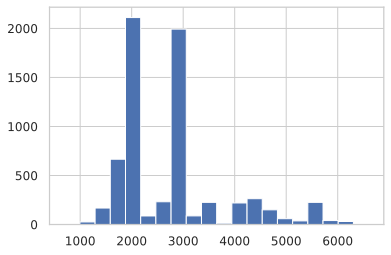

In [413]:
temp_df = df[(df['Train']==1) & (~df['engineDisplacement2'].isna())]
temp_df['engineDisplacement2'].hist(bins = 20)

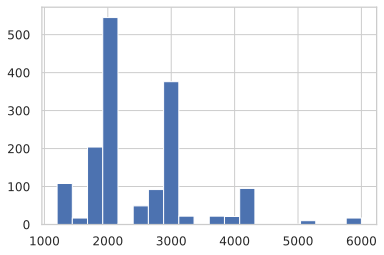

In [414]:
temp_df[temp_df['brand']=='AUDI']['engineDisplacement2'].hist(bins = 20)

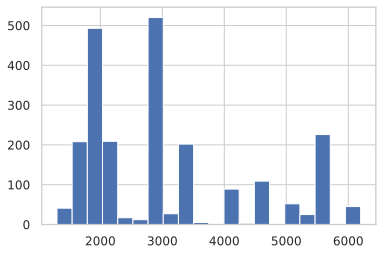

In [415]:
temp_df[temp_df['brand']=='MERCEDES']['engineDisplacement2'].hist(bins = 20)

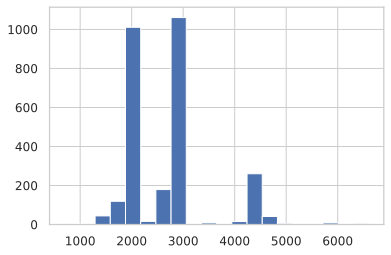

In [416]:
temp_df[temp_df['brand']=='BMW']['engineDisplacement2'].hist(bins = 20)

In [417]:
#попробуем добавить нвые признаки учитывающие модель
df['engDisp_AUDI']= df[df['brand']=='AUDI'].engineDisplacement2
df['engDisp_AUDI_log']=df['engDisp_AUDI'].apply(lambda x: np.log(x))
df['engDisp_MERC']= df[df['brand']=='MERCEDES'].engineDisplacement2
df['engDisp_MERC_log']=df['engDisp_MERC'].apply(lambda x: np.log(x))
df['engDisp_BMW']= df[df['brand']=='BMW'].engineDisplacement2
df['engDisp_BMW_log']=df['engDisp_BMW'].apply(lambda x: np.log(x))

In [418]:
num_cols.append('engDisp_AUDI')
num_cols.append('engDisp_AUDI_log')
num_cols.append('engDisp_MERC')
num_cols.append('engDisp_MERC_log')
num_cols.append('engDisp_BMW')
num_cols.append('engDisp_BMW_log')

In [419]:
#enginePower
df = svodka('enginePower', df)

Количество уникальных значений
во всем датасете:= 152
Количество уникальных значений трейне:= 144
Количество уникальных значений тесте:= 120
Список уникальных значений в трейне:= {'333 N12', '585 N12', '350 N12', '450 N12', '230 N12', '239 N12', '82 N12', '110 N12', '156 N12', '299 N12', '580 N12', '250 N12', '639 N12', '163 N12', '150 N12', '514 N12', '102 N12', '507 N12', '249 N12', '245 N12', '100 N12', '525 N12', '469 N12', '408 N12', '520 N12', '390 N12', '234 N12', '367 N12', '200 N12', '280 N12', '190 N12', '252 N12', '109 N12', '114 N12', '258 N12', '220 N12', '330 N12', '372 N12', '555 N12', '455 N12', '265 N12', '381 N12', '355 N12', '480 N12', '347 N12', '575 N12', '517 N12', '113 N12', '296 N12', '340 N12', '400 N12', '210 N12', '122 N12', '487 N12', '238 N12', '300 N12', '125 N12', '394 N12', '329 N12', '335 N12', '462 N12', '115 N12', '160 N12', '550 N12', '510 N12', '130 N12', '180 N12', '360 N12', '260 N12', '600 N12', '272 N12', '211 N12', '120 N12', '215 N12', '174 N1

In [420]:
#переведем в числовой вид 
df['enginePower2'] = df['enginePower'].apply(lambda x: int(x.split()[0]))

In [421]:
cat_cols.remove('enginePower') 
num_cols.append('enginePower2')

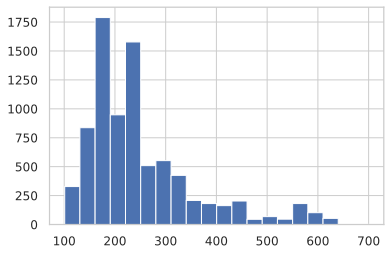

In [422]:
df['enginePower2'].hist(bins = 20)

In [423]:
#прологарифмируем
df['enginePower2_log']=df['enginePower2'].apply(lambda x: np.log(x))

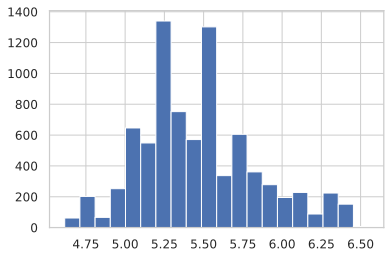

In [424]:
df['enginePower2_log'].hist(bins = 20)

In [425]:
num_cols.append('enginePower2_log')

In [426]:
#fuelType
df = svodka('fuelType', df)

Количество уникальных значений
во всем датасете:= 4
Количество уникальных значений трейне:= 4
Количество уникальных значений тесте:= 4
Список уникальных значений в трейне:= {'гибрид', 'дизель', 'электро', 'бензин'}
Список уникальных значений в тесте:=  {'гибрид', 'дизель', 'электро', 'бензин'}
что есть в трейне и нет в тесте:= set()
что есть в тесте и нет в трейне:= set()
Различий в списках уникальных значений нет.


In [427]:
df[df['Train']==1].fuelType.value_counts()


бензин     4693
дизель     1836
гибрид       12
электро       5
Name: fuelType, dtype: int64

In [428]:
df[df['Train']==0].fuelType.value_counts()

бензин     1214
дизель      454
гибрид        2
электро       1
Name: fuelType, dtype: int64

In [429]:
#распределение по типам топлива в тесте и трейне совпадают

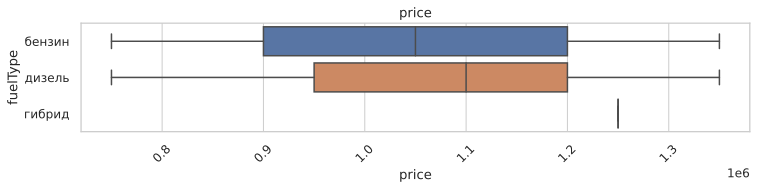

In [430]:
get_boxplot('price','fuelType', df_train)

In [431]:
#гибриды стоят дорого

In [432]:
#model_info
df = svodka('model_info', df)

Количество уникальных значений
во всем датасете:= 117
Количество уникальных значений трейне:= 113
Количество уникальных значений тесте:= 101
Список уникальных значений в трейне:= {'S_KLASSE', '100', 'RS7', 'X4_M', 'Z3', 'None', '8ER', 'CLC_KLASSE', 'CLS_KLASSE_AMG', 'SLR_KLASSE', 'SLS_AMG', 'M3', 'SQ7', 'AMG_GLC_COUPE', 'I8', 'A7', 'G_KLASSE_AMG', 'SLC_KLASSE', 'RS3', 'S8', 'GLE_KLASSE_COUPE_AMG', 'E_KLASSE', 'I3', 'S3', 'S_KLASSE_AMG', 'RSQ3', 'X5_M', 'Q8', 'CLK_KLASSE', 'X_KLASSE', 'R8', 'RS6', 'X6', 'W124', 'CLA_KLASSE', 'B_KLASSE', 'GLS_KLASSE', 'M_KLASSE', 'GLC_KLASSE', 'S7', 'M4', '1ER', 'S_CLASS_MAYBACH', 'A_KLASSE', '7ER', 'W201', 'SL_KLASSE_AMG', 'Q7', 'GLS_KLASSE_AMG', 'V_KLASSE', 'X1', 'Q3', 'M_KLASSE_AMG', 'GLE_KLASSE_AMG', 'CLS_KLASSE', 'GLA_CLASS', 'C_KLASSE_AMG', 'GLA_CLASS_AMG', 'RS5', 'C_KLASSE', 'S4', 'M1', 'M6', '4', 'X6_M', 'TT', 'S5', 'Q5', 'GL_KLASSE_AMG', 'A5', '5ER', 'X7', 'VITO', 'A1', 'CLA_KLASSE_AMG', 'GL_KLASSE', 'VIANO', 'G_KLASSE', 'SLC_KLASSE_AMG', 'X2', 

In [433]:
#name
df[['brand', 'name', 'engineDisplacement2', 'vehicleTransmission', 'enginePower2', 'Привод']].sample(10)

,brand,name,engineDisplacement2,vehicleTransmission,enginePower2,Привод
5992,MERCEDES,63 AMG S 5.5 AT (585 л.с.) 4WD,5500.0,автоматическая,585,полный
3895,AUDI,3.0 AMT (300 л.с.) 4WD,3000.0,роботизированная,300,полный
1839,MERCEDES,300 3.5 AT (249 л.с.) 4WD,3500.0,автоматическая,249,полный
3024,AUDI,3.0 AT (290 л.с.) 4WD,3000.0,автоматическая,290,полный
5894,MERCEDES,500 5.5 AT (388 л.с.) 4WD,5500.0,автоматическая,388,полный
3823,BMW,325i 2.5 AT (218 л.с.),2500.0,автоматическая,218,задний
3938,AUDI,2.8 AMT (204 л.с.) 4WD,2800.0,роботизированная,204,полный
1658,MERCEDES,350 3.0d AT (224 л.с.) 4WD,3000.0,автоматическая,224,полный
4953,MERCEDES,180 1.6 AT (150 л.с.),1600.0,автоматическая,150,задний
3287,MERCEDES,220 CDI 2.1d AT (170 л.с.) 4WD,2100.0,автоматическая,170,полный


In [434]:
# признак name является комбинацией признаков engineDisplacement2, vehicleTransmission, enginePower2, Привод
# у BMW и MERCEDES перед значением объёма двигателя идет название марки, 
# у MERCEDES после объема двигателя идет символ
# разделим по моделям и посмотрим внимательнее

In [435]:
temp_df_BMW = df[df['brand']=='BMW']
temp_df_MERCEDES = df[df['brand']=='MERCEDES']
temp_df_AUDI = df[df['brand']=='AUDI']
temp_df_BMW[['brand', 'name', 'engineDisplacement2', 'fuelType', 'vehicleTransmission', 'enginePower2', 'Привод']].head()

,brand,name,engineDisplacement2,fuelType,vehicleTransmission,enginePower2,Привод
0,BMW,530xi 3.0 AT (272 л.с.) 4WD,3000.0,бензин,автоматическая,272,полный
7,BMW,740Li xDrive 3.0 AT (326 л.с.) 4WD,3000.0,бензин,автоматическая,326,полный
9,BMW,320d xDrive 2.0d AT (184 л.с.) 4WD,2000.0,дизель,автоматическая,184,полный
10,BMW,28i 2.0 AT (245 л.с.) 4WD,2000.0,бензин,автоматическая,245,полный
15,BMW,525i 2.5 AT (218 л.с.),2500.0,бензин,автоматическая,218,задний


In [436]:
#BMW name содержит слово xDrive, которое важно для определения стоимости авто
#символ d это тип топлива 'дизель'

In [437]:
#посмотрим на другие слова
first_set, second_set, third_set = set(), set(), set()
for i in range(len(temp_df_BMW)):
    temp_str = temp_df_BMW.iloc[i]['name']
    volume_engine_str = re.findall('\d\.\d', temp_str)
    if volume_engine_str !=[]:
        ind_str = temp_str.find(volume_engine_str[0])
        temp_str2 = temp_str[:ind_str].split()
        if len(temp_str2)>0:
            first_set.add(temp_str2[0])
            
            if len(temp_str2)>1:
                second_set.add(temp_str2[1])

                if len(temp_str2)>2:
                    third_set.add(temp_str2[2])                
    else:
        if temp_str.find('Electro')>-1:
            print(temp_str)
               
print('second_set:', second_set)
print('third_set :', third_set)

S Electro AT (136 кВт)
Electro AT (126 кВт)
Electro AT (126 кВт)
Electro AT (126 кВт)
Electro AT (126 кВт)
Electro AT (126 кВт)
second_set: {'Pack', 'Package', 'xDrive', 'sDrive'}
third_set : set()


In [438]:
index_row_to_drop = temp_df_BMW[temp_df_BMW.name.str.contains('Pack ')].index
df = df.drop(index_row_to_drop)

In [439]:
#посмотрим на MERCEDES
temp_df_MERCEDES[['brand', 'name', 'engineDisplacement2', 'fuelType', 'vehicleTransmission', 'enginePower2', 'Привод']].sample(5)

,brand,name,engineDisplacement2,fuelType,vehicleTransmission,enginePower2,Привод
6608,MERCEDES,500 5.5 AT (388 л.с.) 4WD,5500.0,бензин,автоматическая,388,полный
6233,MERCEDES,300 3.5 AT (249 л.с.) 4WD,3500.0,бензин,автоматическая,249,полный
927,MERCEDES,500 Long 5.0 AT (306 л.с.),5000.0,бензин,автоматическая,306,задний
3137,MERCEDES,350 3.5 AT (272 л.с.) 4WD,3500.0,бензин,автоматическая,272,полный
1098,MERCEDES,300 d 2.0d AT (245 л.с.) 4WD,2000.0,дизель,автоматическая,245,полный


In [440]:
first_set, second_set, third_set, fourth_set = set(), set(), set(), set()
for i in range(len(temp_df_MERCEDES)):
    temp_str = temp_df_MERCEDES.iloc[i]['name']
    
    volume_engine_str = re.findall('\d\.\d', temp_str)
    if volume_engine_str !=[]:
        ind_str = temp_str.find(volume_engine_str[0])
        temp_str2 = temp_str[:ind_str].split()
        if len(temp_str2)>0:
            first_set.add(temp_str2[0])
            
            if len(temp_str2)>1:
                second_set.add(temp_str2[1])

                if len(temp_str2)>2:
                    third_set.add(temp_str2[2])

                    if len(temp_str2)>3:
                        fourth_set.add(temp_str2[3])                 
    else:
        if temp_str.find('Electro')>-1:
            print(temp_str)
              
print('second_set:', second_set)
print('third_set :', third_set) 
print('fourth_set :', fourth_set) 

second_set: {'BlueTEC', '5G-TRONIC', 'CDI', 'Kompressor', '4MATIC', 'BlueEFFICIENCY', '5G-Tronic', '9G-TRONIC', 'HYBRID', '220', '5-speed', 'd', '4x4', 'S', 'e', 'AMG', 'L2', '700', 'Long', 'длинный'}
third_set : {'BlueTEC', 'BlueEfficiency', 'Long', 'S', 'длинный', 'компактный', 'экстра', 'L1', 'd', 'Edition', 'L2', 'L3'}
fourth_set : {'длинный', 'BlueEFFICIENCY', '507', 'Long'}


In [441]:
#пока пропустим

In [442]:
#AUDI
temp_df_AUDI[['brand', 'name', 'engineDisplacement2', 'fuelType', 'vehicleTransmission', 'enginePower2', 'Привод']].sample(5)

,brand,name,engineDisplacement2,fuelType,vehicleTransmission,enginePower2,Привод
435,AUDI,2.5d AT (180 л.с.) 4WD,2500.0,дизель,автоматическая,180,полный
5350,AUDI,2.0 CVT (180 л.с.),2000.0,бензин,вариатор,180,передний
4756,AUDI,2.0d AMT (177 л.с.) 4WD,2000.0,дизель,роботизированная,177,полный
8053,AUDI,1.4 AMT (125 л.с.),1400.0,бензин,роботизированная,125,передний
6906,AUDI,4.2 AT (335 л.с.) 4WD,4200.0,бензин,автоматическая,335,полный


In [443]:
first_set, second_set, third_set, fourth_set = set(), set(), set(), set()
for i in range(len(temp_df_AUDI)):
    temp_str = temp_df_AUDI.iloc[i]['name']
    
    volume_engine_str = re.findall('\d\.\d', temp_str)
    if volume_engine_str !=[]:
        ind_str = temp_str.find(volume_engine_str[0])
        temp_str2 = temp_str[:ind_str].split()
        if len(temp_str2)>0:
            first_set.add(temp_str2[0])
            
            if len(temp_str2)>1:
                second_set.add(temp_str2[1])

                if len(temp_str2)>2:
                    third_set.add(temp_str2[2])

                    if len(temp_str2)>3:
                        fourth_set.add(temp_str2[3])                 
    else:
        if temp_str.find('Electro')>-1:
            print(temp_str)
        else:
            print(i,'НЛО:', temp_str)       
print('second_set:', second_set)
print('third_set :', third_set) 
print('fourth_set :', fourth_set) 

second_set: {'TDI', 'TFSI', 'diesel'}
third_set : set()
fourth_set : set()


In [444]:
# составим словарь и список слов которые будем извлекать из name
dict_speсial_words_for_pars = {
                               '5G-TRONIC':['5G-TRONIC', '5G-Tronic'],
                               'compact':['компактный'],
                               'Extra':['экстра'],
                               'BlueEFFICIENCY': ['BlueEFFICIENCY', 'BlueEfficiency'],
                               'Long': ['Long', 'длинный']
                               }
list_of_words_for_pars = [
                          'Package', 'xDrive', 'sDrive', 'S ', 
                          'Brabus', 'GT', 'Edition', 'Kompressor', '4MATIC', 
                          'All-Terrain', '9G-TRONIC', '4x4', 'HYBRID',
                          'L1', 'L2', 'L3', '5-speed',
                          'TDI', 'TFSI', 'CDI', 'BlueTEC', 'AMG'
                          ]


In [445]:
for elem in dict_speсial_words_for_pars:
    df[elem]=None
for word in list_of_words_for_pars:
    df[word]=None

df['name2']=None

for i in df.index:
    temp_str = df.loc[i,'name']
    bulean_fill_name2 = True

    for elem in dict_speсial_words_for_pars:
        for word in dict_speсial_words_for_pars[elem]:
            if temp_str.find(word)>-1:
                df.loc[i,elem]=1
                if bulean_fill_name2:
                    df.loc[i,'name2']=elem
                else:
                    df.loc[i,'name2']=df.loc[i,'name2'] + ' ' + elem
                df.loc[i,'name'] = temp_str.replace(word, '')
                temp_str = df.loc[i,'name']
                bulean_fill_name2 = False  

    for word in list_of_words_for_pars:
        if temp_str.find(word)>-1:
            df.loc[i,word]=1
            if bulean_fill_name2:
                df.loc[i,'name2']=word
            else:
                df.loc[i,'name2']=df.loc[i,'name2'] + ' ' + word
            
            df.loc[i,'name'] = temp_str.replace(word, '')
            temp_str = df.loc[i,'name']
            bulean_fill_name2 = False

In [446]:
# добавим новые бинарные признаки 
for elem in dict_speсial_words_for_pars:
    bin_cols.append(elem)
for word in list_of_words_for_pars:
    bin_cols.append(word)

In [447]:
# добавим  категориальный признак name2
cat_cols.append('name2') 

In [448]:
df = df.drop(1526)

In [449]:
def pars_model_from_name(row):
    row = str(row)
    temp_pars = re.findall('\d\.\d', row)
    
     
    if temp_pars == []:
        if row.find('Electro')>-1:
            return 'Electro'
        else:
            return None
    else:
        ind_str = row.find(temp_pars[0])
        
        temp_list = row[:ind_str].split() 
        if temp_list == []:
            return temp_pars[0]
             
        else:
            result = temp_list[0]
            
    return result

In [450]:
df['name3'] = df['name'].apply(pars_model_from_name)

In [451]:
cat_cols.append('name3')
cat_cols.remove('name') 

In [452]:
#vehicleConfiguration
df[df['Train']==1]['vehicleConfiguration'].value_counts(normalize=True)

ALLROAD_5_DOORS AUTOMATIC 3.0    0.157830
SEDAN AUTOMATIC 2.0              0.114185
SEDAN AUTOMATIC 3.0              0.076379
ALLROAD_5_DOORS AUTOMATIC 2.0    0.063470
ALLROAD_5_DOORS ROBOT 2.0        0.027048
                                   ...   
WAGON_5_DOORS MECHANICAL 3.0     0.000154
CABRIO AUTOMATIC 5.5             0.000154
CABRIO AUTOMATIC 3.5             0.000154
CABRIO AUTOMATIC 3.2             0.000154
ALLROAD_3_DOORS AUTOMATIC 3.2    0.000154
Name: vehicleConfiguration, Length: 257, dtype: float64

In [453]:
#признак дублирует информацию из других столбцов
cat_cols.remove('vehicleConfiguration')

In [454]:
#vehicleTransmission
df = svodka('vehicleTransmission', df)

Количество уникальных значений
во всем датасете:= 4
Количество уникальных значений трейне:= 4
Количество уникальных значений тесте:= 4
Список уникальных значений в трейне:= {'роботизированная', 'механическая', 'вариатор', 'автоматическая'}
Список уникальных значений в тесте:=  {'роботизированная', 'механическая', 'вариатор', 'автоматическая'}
что есть в трейне и нет в тесте:= set()
что есть в тесте и нет в трейне:= set()
Различий в списках уникальных значений нет.


In [455]:
#vehicleTransmission: - категориальный признак, 4 значения, пропусков нет

In [456]:
#Владельцы
df = svodka('Владельцы', df, auto_del=False)

Количество уникальных значений
во всем датасете:= 3
Количество уникальных значений трейне:= 4
Количество уникальных значений тесте:= 3
Список уникальных значений в трейне:= {nan, '1\xa0владелец', '2\xa0владельца', '3 или более'}
Список уникальных значений в тесте:=  {'1\xa0владелец', '2\xa0владельца', '3 или более'}
что есть в трейне и нет в тесте:= {nan}
что есть в тесте и нет в трейне:= set()

'nan' в трейне := 0     (0.00% от трейна). можно удалить

In [457]:
#выделим числовые значения
df.loc[:, 'Владельцы'] = df['Владельцы'].apply(lambda x: int(x.split()[0]) if type(x)==str else None)

In [458]:
# посмотрим на пропуски
df[df['Владельцы'].isna()]

,bodyType,brand,color,description,engineDisplacement,enginePower,fuelType,mileage,modelDate,model_info,name,numberOfDoors,price,productionDate,sell_id,vehicleConfiguration,vehicleTransmission,Владельцы,Владение,ПТС,Привод,Руль,Train,engineDisplacement2,engDisp_AUDI,engDisp_AUDI_log,engDisp_MERC,engDisp_MERC_log,engDisp_BMW,engDisp_BMW_log,enginePower2,enginePower2_log,5G-TRONIC,compact,Extra,BlueEFFICIENCY,Long,Package,xDrive,sDrive,S,Brabus,GT,Edition,Kompressor,4MATIC,All-Terrain,9G-TRONIC,4x4,HYBRID,L1,L2,L3,5-speed,TDI,TFSI,CDI,BlueTEC,AMG,name2,name3
4994,седан,AUDI,чёрный,машина в идеале! вложено примерно 400тыс.руб \...,4.2 LTR,360 N12,бензин,160000,1999,S8,4.2 AT (360 л.с.) 4WD,4,600000.0,2001,1019330519,SEDAN AUTOMATIC 4.2,автоматическая,NaN,10 лет и 7 месяцев,Оригинал,полный,Левый,1,4200.0,4200.0,8.34284,NaN,NaN,NaN,NaN,360,5.886104,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,4.2


In [459]:
temp_df_Train = df[df['Train']==1]
temp_df_Train[(temp_df_Train['mileage']>=140000) \
            & (temp_df_Train['mileage']<=160000) \
            & (temp_df_Train['brand']=='AUDI') \
            & (temp_df_Train['productionDate']>=1999) \
            & (temp_df_Train['productionDate']<=2002)
                ][['brand', 
                   'mileage',  
                   'productionDate',  
                   'modelDate', 
                   'name',
                   'price',
                   'Владельцы']]

,brand,mileage,productionDate,modelDate,name,price,Владельцы
1003,AUDI,145402,2000,2000,2.7 MT (250 л.с.) 4WD,390000.0,1.0
1026,AUDI,160000,2002,1998,1.8 MT (180 л.с.),650000.0,2.0
3401,AUDI,148000,2002,2000,2.0 CVT (130 л.с.),330000.0,3.0
4994,AUDI,160000,2001,1999,4.2 AT (360 л.с.) 4WD,600000.0,NaN
5330,AUDI,155000,2001,1999,1.8 AT (170 л.с.),320000.0,3.0


In [460]:
# среди авто Ауди примерного такого пробега и года в среднем 2 владельца.
df.loc[4994, 'Владельцы']=2

In [461]:
#Владельцы: - категориальный признак с 4 значениями. Пропусков нет.

In [462]:
#Владение
len(df[df['Владение'].isna()])

5294

In [463]:
#заполняем пропуски значением nodata
df['Владение'] = df['Владение'].fillna('nodata')

def pars_num_from_tenure(row):
    d_pars_list_of_num_from_row = re.findall('\d+',row)
    if d_pars_list_of_num_from_row != []:
        if len(d_pars_list_of_num_from_row)>1:
            years = int(d_pars_list_of_num_from_row[0])
            months = int(d_pars_list_of_num_from_row[1])
            return years*12 + months
        else:
            if row.find('месяц')>-1:
                return int(d_pars_list_of_num_from_row[0])
            else:
                return int(d_pars_list_of_num_from_row[0])*12
    return None
    
df['Владение2'] = df['Владение'].apply(pars_num_from_tenure)

In [464]:
#исходя из предыдущего опыта выделим два признака: владение менее 6 мес и менее 3 мес 
def fill_month_3 (row):
    if row <=3:
        return 1
    return None
df['3month'] = df['Владение2'].apply(fill_month_3)

def fill_month_6 (row):
    if 3< row <=6:
        return 1
    return None
df['6month'] = df['Владение2'].apply(fill_month_6)

In [465]:
# удаляем признак
cat_cols.remove('Владение')

# добавляем два бинарных
bin_cols.append('3month')
bin_cols.append('6month')

In [466]:
#ПТС
df = svodka('ПТС', df)

Количество уникальных значений
во всем датасете:= 2
Количество уникальных значений трейне:= 2
Количество уникальных значений тесте:= 2
Список уникальных значений в трейне:= {'Оригинал', 'Дубликат'}
Список уникальных значений в тесте:=  {'Оригинал', 'Дубликат'}
что есть в трейне и нет в тесте:= set()
что есть в тесте и нет в трейне:= set()
Различий в списках уникальных значений нет.


In [467]:
#ПТС: - категориальный признак, 2 значения, пропусков нет

In [468]:
#Привод
df = svodka('Привод', df)

Количество уникальных значений
во всем датасете:= 3
Количество уникальных значений трейне:= 3
Количество уникальных значений тесте:= 3
Список уникальных значений в трейне:= {'задний', 'передний', 'полный'}
Список уникальных значений в тесте:=  {'задний', 'передний', 'полный'}
что есть в трейне и нет в тесте:= set()
что есть в тесте и нет в трейне:= set()
Различий в списках уникальных значений нет.


In [469]:
#Привод: - категориальный признак, 3 значения, пропусков нет

In [470]:
# Руль
df = svodka('Руль', df)

Количество уникальных значений
во всем датасете:= 2
Количество уникальных значений трейне:= 2
Количество уникальных значений тесте:= 1
Список уникальных значений в трейне:= {'Левый', 'Правый'}
Список уникальных значений в тесте:=  {'Левый'}
что есть в трейне и нет в тесте:= {'Правый'}
что есть в тесте и нет в трейне:= set()

'Правый' в трейне := 1     (0.02% от трейна). можно удалить
Удаление завершено


In [471]:
cat_cols.remove('Руль')

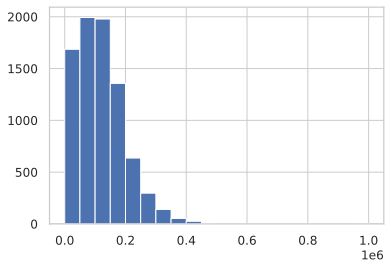

In [472]:
#mileage
df['mileage'].hist(bins = 20)

In [473]:
# посмотрим на авто с пробегом 999999
df.loc[1922]['description']

'Рейстайлинг. \nОдин хозяин по ПТС. Оригинальный пробег 98500 км.\n\nСостояние Очень Хорошее ! \nСделано ТО + замена масла в АКПП\nНовая резина !\n\nТехнически и юридически безупречен.\n \nКуплен в августа 2009 , \nБережная эксплуатация и своевременная замена всех расходников. \nВсе системы работают исправно. \nДва ключа. \nМосковские с номера. \nАВТОМОБИЛЬ НЕ ТРЕБУЕТ ВЛОЖЕНИЙ. \nКожанны салон\nПодушки безопасности \nABS EBD ESP \nПарктроник \nТеплый шарф.\nОхранная система \nИммобилайзер \nЦентральный замок\nДатчик света \nДатчик дождя \nОмыватель фар \nКсеноновые фары \nБортовой компьютер \nКруиз контроль \nМультируль \nЭлектропривод богажника \nЭлектрические зеркала с обогревом \nОбогрев сидений \nКлимат контроль 2-зонный \nПротивотуманные фары\nПосредникам, автосалонам и рекламным агентам - просьба не беспокоить.\nТорг.'

In [474]:
# исправим ошибку
df.loc[1922,'mileage'] = 98500

In [475]:
# mileage: - признак числовой. Пропусков нет.

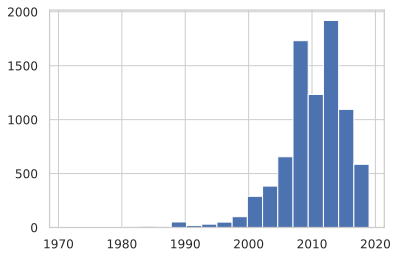

In [476]:
#modelDate
df['modelDate'].hist(bins = 20)

In [477]:
#развернем гистограмму
df['modelDate2'] = 2020 - df['modelDate']

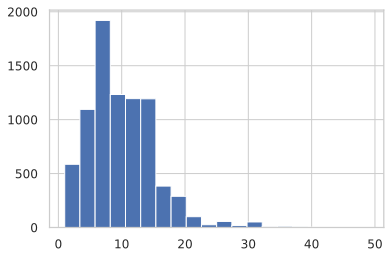

In [478]:
df['modelDate2'].hist(bins = 20)

In [479]:
num_cols.remove('modelDate')
num_cols.append('modelDate2')

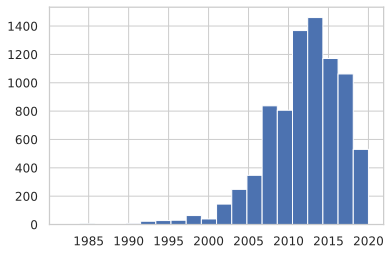

In [480]:
#productionDate
df['productionDate'].hist(bins = 20)

In [481]:
#тоже развернем
df['productionDate2'] = 2021 - df['productionDate']

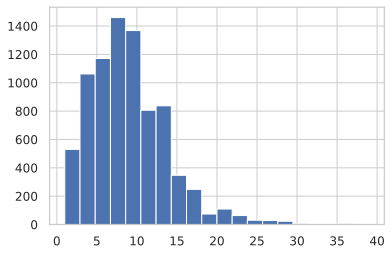

In [482]:
df['productionDate2'].hist(bins = 20)

In [483]:
num_cols.remove('productionDate')
num_cols.append('productionDate2')

In [484]:
df['productionDate2_log']=df['productionDate2'].apply(lambda x: np.log(x))

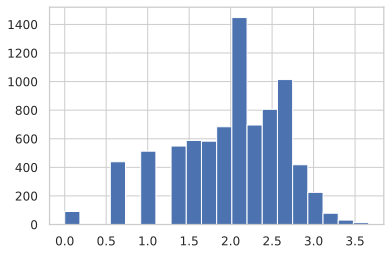

In [485]:
df['productionDate2_log'].hist(bins = 20)

In [486]:
num_cols.append('productionDate2_log')

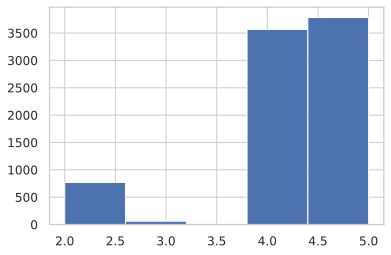

In [487]:
#numberOfDoors
df['numberOfDoors'].hist(bins = 5)

In [488]:
#переместим в категориальный признак 
cat_cols.append('numberOfDoors')
num_cols.remove('numberOfDoors')

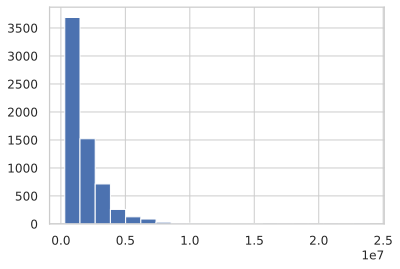

In [489]:
#price
df['price'].hist(bins = 20)

In [490]:
#прологарифмируем
df['price_log']=df['price'].apply(lambda x: np.log(x))

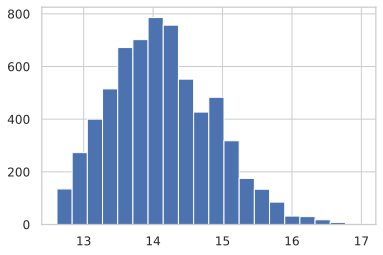

In [491]:
df['price_log'].hist(bins = 20)

In [492]:
target_col.append('price_log')

In [493]:
#description
# запишем списки слов в описании в отдельный столбец
df['words_in_description'] = df['description'].apply(lambda x: [str(i).lower() for i in x.split()])

In [494]:
# создаем признак кол-во слов в описании
df['count_words_d'] = df['description'].apply(lambda x: len(x.split()))

In [495]:
vectorizer = CountVectorizer()
text_feat = vectorizer.fit_transform(df['description'])

In [496]:
# создаем новые признаки кол-во среднее кол-во токенов и их сумма в описании
df['mean_c_w'] = text_feat.mean(axis=1)
df['sum_c_w'] = text_feat.sum(axis=1)

In [497]:
#cat_cols.remove('description')

num_cols.append('count_words_d')
num_cols.append('mean_c_w')
num_cols.append('sum_c_w')

In [498]:
# обработка слов в words_in_description
df['c_p_des1']= df['words_in_description'].apply(lambda x: 1 if ('защита' and 'картера') in x else 0)
bin_cols.append('c_p_des1')

# мультифункциональный руль - multifunction steering wheel
df['m_s_w_des2']= df['words_in_description'].apply(lambda x: 1 if ('мультифункциональный' and 'руль') in x else 0)
bin_cols.append('m_s_w_des2')

# датчики дождя и света - rain and light sensors
df['r_l_s_des3']= df['words_in_description'].apply(lambda x: 1 if ('датчики' and 'дождя' and 'света') in x else 0)
bin_cols.append('r_l_s_des3')

# АБС
df['abs_des4']= df['words_in_description'].apply(lambda x: 1 if ('антиблокировочная' and 'система') in x else 0)
bin_cols.append('abs_des4')

# круиз контроль - cruise control
df['c_c_des5']= df['words_in_description'].apply(lambda x: 1 if ('круиз-контроль') in x else 0)
bin_cols.append('c_c_des5')

# легкосплавные диски - alloy wheels
df['a_w_des6']= df['words_in_description'].apply(lambda x: 1 if ('легкосплавные' and 'диски') in x else 0)
bin_cols.append('a_w_des6')

# камера заднего вида - rear view camera
df['r_v_c_des7']= df['words_in_description'].apply(lambda x: 1 if ('камера' and 'видеокамера') in x else 0)
bin_cols.append('r_v_c_des7')

In [499]:
# добавляем  'description' в новый список текстовых признаков
text_cols =['description']

In [500]:
#посчитаем Транспортный налог
df['tax'] = df.enginePower2.apply(lambda x: x*12 if x <= 100
                                     else x*25 if x > 100 and x <= 125
                                     else x*35 if x > 125 and x <= 150
                                     else x*45 if x > 150 and x <= 175
                                     else x*55 if x > 175 and x <= 200
                                     else x*65 if x > 200 and x <= 225
                                     else x*75 if x > 225 and x <= 250
                                     else x*150)

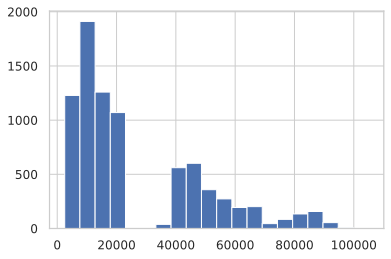

In [501]:
df['tax'].hist(bins = 20)

In [502]:
num_cols.append('tax')

In [503]:
#разобьем на категории
df['tax_cat'] = df.enginePower2.apply(lambda x: '1' if x <= 100
                                         else '2' if x > 100 and x <= 125
                                         else '3' if x > 125 and x <= 150
                                         else '4' if x > 150 and x <= 175
                                         else '5' if x > 175 and x <= 200
                                         else '6' if x > 200 and x <= 225
                                         else '7' if x > 225 and x <= 250
                                         else '8')

In [504]:
cat_cols.append('tax_cat')

In [505]:
#оценим интенсивность эксплуатации
df['intens_of_expl'] = df['mileage']/(df['productionDate2']+2)


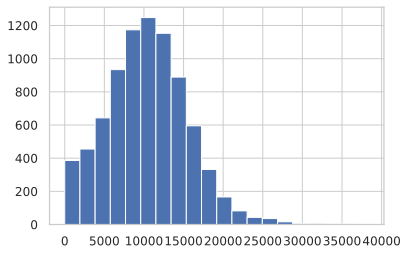

In [506]:
df['intens_of_expl'].hist(bins = 20)

In [507]:
#добавим признак указывающий черезмерную интенсивность
def borders_of_outliers_intens_of_expl(row):
    if row > 23733:
        return 1
    return 0

df['intens_of_expl_out'] = df['intens_of_expl'].apply(borders_of_outliers_intens_of_expl)

In [508]:
num_cols.append('intens_of_expl')
bin_cols.append('intens_of_expl_out')

In [509]:
#разобьем пробег на категории
df['mileage_cat'] = df.mileage.apply(lambda x: '50' if x <= 50
                                         else '100' if x > 50 and x <= 100
                                         else '150' if x > 100 and x <= 150
                                         else '200' if x > 150 and x <= 200
                                         else '300')

In [510]:
cat_cols.append('mileage_cat')

In [511]:
#разобьем дату производства на категории
df['productionDate2_cat'] = df.productionDate2.apply(lambda x: '1' if x <= 1
                                         else '3' if x > 1 and x <= 3
                                         else '5' if x > 5 and x <= 5
                                         else '7' if x > 5 and x <= 7
                                         else '10')

In [512]:
cat_cols.append('productionDate2_cat')

In [513]:
#дополнительно обраотаем пропуски
for col in bin_cols:
    df[col].fillna(0, inplace=True)

In [514]:
candidates_for_fillna = []
for col in num_cols:
    if df[col].isna().sum()>0:
        candidates_for_fillna.append(col)

In [515]:
from sklearn.preprocessing import MinMaxScaler
# Нормализация данных
scaler = MinMaxScaler()
for col in candidates_for_fillna:
    df[col] = scaler.fit_transform(df[[col]])[:,0]

In [516]:
for col in candidates_for_fillna:
        df[col].fillna(df[col].median(), inplace=True)

In [517]:
# категориальных
for col in cat_cols:
    df[col].fillna('empty', inplace=True)

In [518]:
all_cols =cat_cols + num_cols + servis_cols + bin_cols + target_col

In [519]:
df2 = df.loc[:, all_cols].copy()

In [520]:
df2.to_csv('df2.csv', index=False)

In [521]:
df_cols = pd.DataFrame()
df_cols['cat_cols']=[','.join(cat_cols)]
df_cols['num_cols']=[','.join(num_cols)]
df_cols['servis_cols']=[','.join(servis_cols)]
df_cols['bin_cols']=[','.join(bin_cols)]
df_cols['target_col']=[','.join(target_col)]
df_cols['text_cols']=[','.join(text_cols)]
df_cols.to_csv('df2_cols.csv', index=False)

In [522]:
#кореляции
def simple_heatmap(d_df, d_list_of_columns, d_my_font_scale, d_g, d_size):

    temp_df = d_df[d_list_of_columns].copy()

    plt.style.use('seaborn-paper')
    plt.subplots(figsize=(d_size, 10))
    
    sns.set(font_scale=d_my_font_scale, style='whitegrid')

    plt.subplot(111)
    h = sns.heatmap(temp_df.corr(), annot = True, fmt=f'.{d_g}g', center= 0)
    

    return

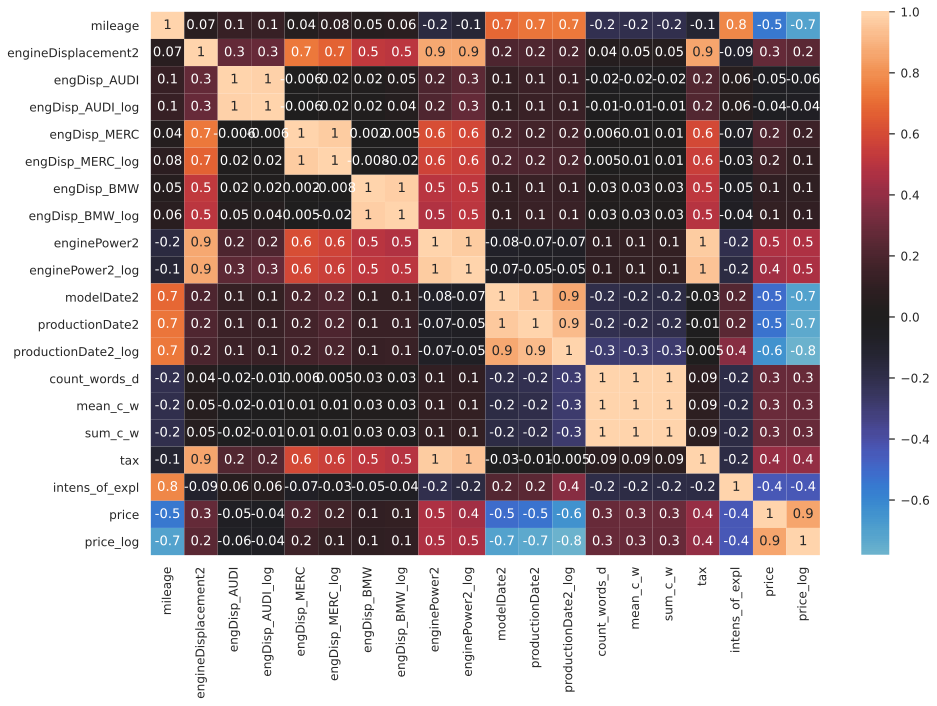

In [523]:
simple_heatmap(df[df['Train']==1], num_cols+target_col, 1.1, 0, 15)

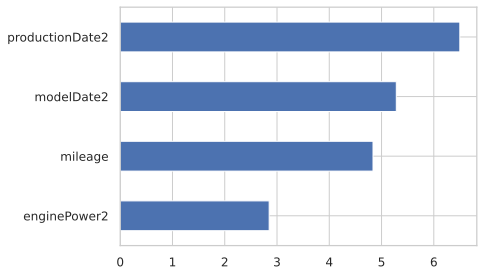

In [524]:
#Значимость непрерывных переменных по ANOVA F test
temp_num_cols = ['mileage', 'productionDate2','enginePower2', 'modelDate2']
temp_df = df[df['Train']==1]
imp_num = pd.Series(f_classif(temp_df[temp_num_cols], temp_df['price_log'])[0], index = temp_num_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

In [525]:
#Проверим статистическую значимость по всем не числовым признакам по тесту Стьюдента
# переведем категориальные признаки в dummies переменные
# но сначала сохраним список переменных чтобы можно было сделать список добавленных
list_cols_bef_dumm = list(df.columns)

# а также мы хотим преобразовать числовые признаки 'Владельцы' и 'engineDisplacement2'
# поэтому сохраним их дубликаты
arr_pers = np.array(df['Владельцы'])

# преобразуем переменные в дамми переменные
df = pd.get_dummies(df, columns = ['bodyType', 'brand', 'color', 'fuelType', 'vehicleTransmission', 'Привод', 'Владельцы', 'ПТС', 'engineDisplacement2'])

# вернем владельцев
df['Владельцы'] = arr_pers 

# теперь создадим список дамми переменных
list_cols_aft_dumm = list(df.columns)
dumm_cols= list(set(list_cols_aft_dumm)-set(list_cols_bef_dumm ))

In [526]:
def get_stat_dif(d_column, d_df):
    cols = d_df.loc[:, d_column].value_counts().index[:]
    combinations_all = list(combinations(cols, 2))
    for comb in combinations_all:
        ttest = ttest_ind(d_df.loc[d_df.loc[:, d_column] == comb[0], 'price_log'].dropna(),
                          d_df.loc[d_df.loc[:, d_column] == comb[1], 'price_log'].dropna()).pvalue
        if  ttest<= 0.05/len(combinations_all): # Учли поправку Бонферони
            return(d_column)
            break

In [527]:
stat_sign_diff_cols=[]

temp_df = df[(df['Train']==1)]
for col in bin_cols+dumm_cols:
    stat_sign_diff_cols.append(get_stat_dif(col,temp_df))
stat_sign_diff_cols = list(filter(None, stat_sign_diff_cols))

In [528]:
not_stat_sign_diff_cols=list(set(bin_cols+dumm_cols) - set(stat_sign_diff_cols))
print(f'по тесту Стьюдента {len(not_stat_sign_diff_cols)} признаков из {len(bin_cols+dumm_cols)} бинарных и dummies признаков НЕ СОДЕРЖАТ СТАТИСТИЧЕСКИ ЗНАЧИМЫХ РАЗЛИЧИЙ с таргетом')
print('вот они:= ', *sorted(not_stat_sign_diff_cols))

по тесту Стьюдента 40 признаков из 127 бинарных и dummies признаков НЕ СОДЕРЖАТ СТАТИСТИЧЕСКИ ЗНАЧИМЫХ РАЗЛИЧИЙ с таргетом
вот они:=  4x4 5-speed 5G-TRONIC 9G-TRONIC All-Terrain Brabus Edition GT HYBRID L1 L2 L3 bodyType_внедорожник 3 дв. bodyType_внедорожник открытый bodyType_кабриолет bodyType_купе-хардтоп bodyType_пикап двойная кабина bodyType_родстер color_белый color_голубой color_жёлтый color_коричневый color_оранжевый color_синий color_фиолетовый engineDisplacement2_0.0 engineDisplacement2_0.13559322033898308 engineDisplacement2_0.2033898305084746 engineDisplacement2_0.2711864406779661 engineDisplacement2_0.5254237288135594 engineDisplacement2_0.576271186440678 engineDisplacement2_0.6101694915254238 engineDisplacement2_0.864406779661017 engineDisplacement2_0.8813559322033898 engineDisplacement2_0.8983050847457629 engineDisplacement2_1.0000000000000002 fuelType_гибрид fuelType_электро sDrive vehicleTransmission_роботизированная


In [529]:
#сохраним результаты
df.to_csv('df.csv', index=False)

In [530]:
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# # keras
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import albumentations

# plt
import matplotlib.pyplot as plt
#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline

from datetime import datetime as dt
import random as rn
from tensorflow.keras.layers import *
from tensorflow.keras import optimizers
from tensorflow.keras.regularizers import l2
import tensorflow.keras.backend as K
import nltk
from nltk.corpus import stopwords

import pymorphy2


In [531]:
#обозначим метрику
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [532]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42  # фиксируем состояние генератора псевдо-случайных чисел для воспроизводимости результата
np.random.seed(RANDOM_SEED)
os.environ['PYTHONHASHSEED'] = '0'
rn.seed(RANDOM_SEED)

In [533]:
#зафиксируем версии пакетов
!pip freeze > requirements.txt

Model 1: Создадим "наивную" модель

Эта модель будет предсказывать среднюю цену по модели и году выпуска. C ней будем сравнивать другие модели.

In [534]:
train = pd.read_csv('../input/sf-dst-car-price-prediction-part2/train.csv')
test = pd.read_csv('../input/sf-dst-car-price-prediction-part2/test.csv')
sample_submission = pd.read_csv('../input/sf-dst-car-price-prediction-part2/sample_submission.csv')

In [535]:
# split данных
data_train, data_test = train_test_split(train, test_size=0.15, shuffle=True, random_state=RANDOM_SEED)

In [536]:
# Наивная модель
predicts = []
for index, row in pd.DataFrame(data_test[['model_info', 'productionDate']]).iterrows():
    query = f"model_info == '{row[0]}' and productionDate == '{row[1]}'"
    predicts.append(data_train.query(query)['price'].median())

# заполним не найденные совпадения
predicts = pd.DataFrame(predicts)
predicts = predicts.fillna(predicts.median())

# округлим
predicts = (predicts // 1000) * 1000

#оцениваем точность
print(f"Точность наивной модели по метрике MAPE: {(mape(data_test['price'], predicts.values[:, 0]))*100:0.2f}%")

Точность наивной модели по метрике MAPE: 19.88%


In [537]:
#EDA

In [538]:
df3 = pd.read_csv('./df2.csv')

pd.set_option('display.max_columns', None)
print('Размерность преобработанного датасета: ', df3.shape)

Размерность преобработанного датасета:  (8177, 75)


In [539]:
df3.sample()

,bodyType,brand,color,description,fuelType,model_info,vehicleTransmission,Владельцы,ПТС,Привод,name2,name3,numberOfDoors,tax_cat,mileage_cat,productionDate2_cat,mileage,engineDisplacement2,engDisp_AUDI,engDisp_AUDI_log,engDisp_MERC,engDisp_MERC_log,engDisp_BMW,engDisp_BMW_log,enginePower2,enginePower2_log,modelDate2,productionDate2,productionDate2_log,count_words_d,mean_c_w,sum_c_w,tax,intens_of_expl,Train,sell_id,5G-TRONIC,compact,Extra,BlueEFFICIENCY,Long,Package,xDrive,sDrive,S,Brabus,GT,Edition,Kompressor,4MATIC,All-Terrain,9G-TRONIC,4x4,HYBRID,L1,L2,L3,5-speed,TDI,TFSI,CDI,BlueTEC,AMG,3month,6month,c_p_des1,m_s_w_des2,r_l_s_des3,abs_des4,c_c_des5,a_w_des6,r_v_c_des7,intens_of_expl_out,price,price_log
239,седан,AUDI,белый,"[Smart]\nОригинал ПТС, Два ключа\n\n\nПанавто ...",бензин,A3,роботизированная,2.0,Оригинал,передний,empty,1.4,4,2,300,7,141690,0.118644,0.041667,0.095779,0.346939,0.535307,0.355932,0.617849,122,4.804021,8,7,1.94591,82,0.002097,78,3050,15743.333333,1,1099741704,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,1,0,1,0,0,679000.0,13.428376


In [540]:
df3_cols= pd.read_csv('./df2_cols.csv')
cat_cols=df3_cols['cat_cols'][0].split(',')
num_cols = df3_cols['num_cols'][0].split(',')
servis_cols = df3_cols['servis_cols'][0].split(',')
bin_cols = df3_cols['bin_cols'][0].split(',')
target_col= df3_cols['target_col'][0].split(',')
text_cols= df3_cols['text_cols'][0].split(',')

In [541]:
df3['modelDate2_log']=df3['modelDate2'].apply(lambda x: np.log(x))
num_cols.append('modelDate2_log')
'engineDisplacement2'
df3['engineDisplacement2_log']=df3['engineDisplacement2'].apply(lambda x: np.log(x+1))
num_cols.append('engineDisplacement2_log')

In [542]:
#выберем признаки для catbusta
categorical_features = [
    'bodyType',
    'brand',
    'color',
    'fuelType',
    'model_info',
    'vehicleTransmission',
    'ПТС',
    'Привод',
    'name3',
    'Владельцы',
]

numerical_features = [   
    'mileage',
    'engDisp_AUDI_log',
    'engDisp_MERC_log',
    'engDisp_BMW_log',
    'enginePower2_log',
    'modelDate2',
    'productionDate2_log',
]

bin_features = [
    '5G-TRONIC',
    'compact',
    'Extra',
    'BlueEFFICIENCY',
    'Long',
    'Package',
    'xDrive',
    'sDrive',
    'S ',
    'Brabus',
    'GT',
    'Edition',
    'Kompressor',
    '4MATIC',
    'All-Terrain',
    '9G-TRONIC',
    '4x4',
    'HYBRID',
    'L1',
    'L2',
    'L3',
    '5-speed',
    'TDI',
    'TFSI',
    'CDI',
    'BlueTEC',
    'AMG',
    '3month',
    '6month',
    'c_p_des1',
    'm_s_w_des2',
    'r_l_s_des3',
    'abs_des4',
    'c_c_des5',
    'a_w_des6',
    'r_v_c_des7',
    'intens_of_expl_out'
]

In [543]:
data = df3.copy()
data['sample']=data['Train']

In [544]:
def preproc_data(df_input,d_all_cols):
    '''includes several functions to pre-process the predictor data.'''
    
    df_output = df_input.copy()
    
    # ################### 1. Предобработка ##############################################################    
 
    
    # ################### Categorical Features ############################################################## 
    # Label Encoding
    for column in categorical_features:
        df_output[column] = df_output[column].astype('category').cat.codes
    was_cols = list(df_output.columns)
      
    # One-Hot Encoding: в pandas есть готовая функция - get_dummies.
    df_output = pd.get_dummies(df_output, columns=categorical_features, dummy_na=False)
    new_cols = list(df_output.columns)
    
    dumm_cols =[]
    for col in new_cols:
        
        if col not in was_cols:
            dumm_cols.append(col)           
   
    
    return df_output[d_all_cols+dumm_cols]

In [545]:
all_cols = numerical_features + bin_features + ['sample'] + ['price_log']

In [546]:
# Запускаем и проверяем, что получилось
df_preproc = preproc_data(data, all_cols)
df_preproc.sample(10)

,mileage,engDisp_AUDI_log,engDisp_MERC_log,engDisp_BMW_log,enginePower2_log,modelDate2,productionDate2_log,5G-TRONIC,compact,Extra,BlueEFFICIENCY,Long,Package,xDrive,sDrive,S,Brabus,GT,Edition,Kompressor,4MATIC,All-Terrain,9G-TRONIC,4x4,HYBRID,L1,L2,L3,5-speed,TDI,TFSI,CDI,BlueTEC,AMG,3month,6month,c_p_des1,m_s_w_des2,r_l_s_des3,abs_des4,c_c_des5,a_w_des6,r_v_c_des7,intens_of_expl_out,sample,price_log,bodyType_0,bodyType_1,bodyType_2,bodyType_3,bodyType_4,bodyType_5,bodyType_6,bodyType_7,bodyType_8,bodyType_9,bodyType_10,bodyType_11,bodyType_12,bodyType_13,brand_0,brand_1,brand_2,color_0,color_1,color_2,color_3,color_4,color_5,color_6,color_7,color_8,color_9,color_10,color_11,color_12,color_13,color_14,fuelType_0,fuelType_1,fuelType_2,fuelType_3,model_info_0,model_info_1,model_info_2,model_info_3,model_info_4,model_info_5,model_info_6,model_info_7,model_info_8,model_info_9,model_info_10,model_info_11,model_info_12,model_info_13,model_info_14,model_info_15,model_info_16,model_info_17,model_info_18,model_info_19,model_info_20,model_info_21,model_info_22,model_info_23,model_info_24,model_info_25,model_info_26,model_info_27,model_info_28,model_info_29,model_info_30,model_info_31,model_info_32,model_info_33,model_info_34,model_info_35,model_info_36,model_info_37,model_info_38,model_info_39,model_info_40,model_info_41,model_info_42,model_info_43,model_info_44,model_info_45,model_info_46,model_info_47,model_info_48,model_info_49,model_info_50,model_info_51,model_info_52,model_info_53,model_info_54,model_info_55,model_info_56,model_info_57,model_info_58,model_info_59,model_info_60,model_info_61,model_info_62,model_info_63,model_info_64,model_info_65,model_info_66,model_info_67,model_info_68,model_info_69,model_info_70,model_info_71,model_info_72,model_info_73,model_info_74,model_info_75,model_info_76,model_info_77,model_info_78,model_info_79,model_info_80,model_info_81,model_info_82,model_info_83,model_info_84,model_info_85,model_info_86,model_info_87,model_info_88,model_info_89,model_info_90,model_info_91,model_info_92,model_info_93,model_info_94,model_info_95,model_info_96,model_info_97,model_info_98,model_info_99,model_info_100,vehicleTransmission_0,vehicleTransmission_1,vehicleTransmission_2,vehicleTransmission_3,ПТС_0,ПТС_1,Привод_0,Привод_1,Привод_2,name3_0,name3_1,name3_2,name3_3,name3_4,name3_5,name3_6,name3_7,name3_8,name3_9,name3_10,name3_11,name3_12,name3_13,name3_14,name3_15,name3_16,name3_17,name3_18,name3_19,name3_20,name3_21,name3_22,name3_23,name3_24,name3_25,name3_26,name3_27,name3_28,name3_29,name3_30,name3_31,name3_32,name3_33,name3_34,name3_35,name3_36,name3_37,name3_38,name3_39,name3_40,name3_41,name3_42,name3_43,name3_44,name3_45,name3_46,name3_47,name3_48,name3_49,name3_50,name3_51,name3_52,name3_53,name3_54,name3_55,name3_56,name3_57,name3_58,name3_59,name3_60,name3_61,name3_62,name3_63,name3_64,name3_65,name3_66,name3_67,name3_68,name3_69,name3_70,name3_71,name3_72,name3_73,name3_74,name3_75,name3_76,name3_77,name3_78,name3_79,name3_80,name3_81,name3_82,name3_83,name3_84,name3_85,name3_86,name3_87,name3_88,name3_89,name3_90,name3_91,name3_92,name3_93,name3_94,name3_95,name3_96,name3_97,name3_98,name3_99,name3_100,name3_101,name3_102,name3_103,name3_104,name3_105,name3_106,name3_107,name3_108,name3_109,name3_110,name3_111,name3_112,name3_113,name3_114,name3_115,name3_116,name3_117,name3_118,name3_119,name3_120,name3_121,name3_122,name3_123,name3_124,name3_125,name3_126,name3_127,name3_128,name3_129,name3_130,name3_131,name3_132,name3_133,name3_134,name3_135,name3_136,name3_137,name3_138,name3_139,name3_140,name3_141,name3_142,name3_143,name3_144,name3_145,name3_146,name3_147,name3_148,name3_149,name3_150,name3_151,name3_152,name3_153,name3_154,name3_155,name3_156,name3_157,name3_158,name3_159,name3_160,name3_161,name3_162,name3_163,name3_164,name3_165,name3_166,name3_167,name3_168,name3_169,name3_170,name3_171,name3_172,name3_173,name3_174,name3_175,name3_176,name3_177,name3_178,name3_179,name3_180,name3_181,na

In [547]:
# Теперь выделим тестовую часть
train_data = df_preproc.query('sample == 1').drop(['sample'], axis=1)
test_data = df_preproc.query('sample == 0').drop(['sample'], axis=1)

y = train_data.price_log.values     # наш таргет
X = train_data.drop(['price_log'], axis=1)
X_sub = test_data.drop(['price_log'], axis=1)

In [548]:
y.shape, X.shape, X_sub.shape

((6506,), (6506, 390), (1671, 390))

In [549]:
X_columns = X.columns
scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)
X_sub = scaler.transform(X_sub)

In [550]:
X.min(), X.max(), X_sub.min(), X_sub.max()

(0.0, 1.0, -0.005369298900498531, 1.8181833057878285)

In [551]:
X = pd.DataFrame(X, columns=X_columns)
X_sub = pd.DataFrame(X_sub, columns=X_columns)

Model 2: CatBoostRegressor

In [552]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=True, random_state=RANDOM_SEED)

In [553]:
model = CatBoostRegressor(iterations = 10000,
                          #depth=10,
                          #learning_rate = 0.5,
                          random_seed = RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['RMSE', 'MSLE'],
                          od_wait=1000,
                          #task_type='GPU',
                         )
model.fit(X_train, y_train,
         eval_set=(X_test, y_test),
         verbose_eval=100,
         use_best_model=True,
         #plot=True
         )

Learning rate set to 0.015166
0:	learn: 0.0416035	test: 0.0413649	best: 0.0413649 (0)	total: 5.11ms	remaining: 51.1s
100:	learn: 0.0165110	test: 0.0165705	best: 0.0165705 (100)	total: 385ms	remaining: 37.8s
200:	learn: 0.0116144	test: 0.0116359	best: 0.0116359 (200)	total: 751ms	remaining: 36.6s
300:	learn: 0.0103570	test: 0.0104027	best: 0.0104027 (300)	total: 1.1s	remaining: 35.6s
400:	learn: 0.0098385	test: 0.0099132	best: 0.0099132 (400)	total: 1.45s	remaining: 34.7s
500:	learn: 0.0094896	test: 0.0096143	best: 0.0096143 (500)	total: 1.79s	remaining: 34s
600:	learn: 0.0091983	test: 0.0093816	best: 0.0093816 (600)	total: 2.14s	remaining: 33.4s
700:	learn: 0.0089716	test: 0.0092098	best: 0.0092098 (700)	total: 2.48s	remaining: 32.9s
800:	learn: 0.0087125	test: 0.0090139	best: 0.0090139 (800)	total: 2.82s	remaining: 32.4s
900:	learn: 0.0084719	test: 0.0088455	best: 0.0088455 (900)	total: 3.17s	remaining: 32.1s
1000:	learn: 0.0082796	test: 0.0087044	best: 0.0087044 (1000)	total: 3.53s	r

In [554]:
test_predict_catboost = np.exp(model.predict(X_test))
print(f"TEST mape: {(mape(np.exp(y_test), test_predict_catboost))*100:0.2f}%")

TEST mape: 10.94%


In [555]:
sub_predict_catboost = np.exp(model.predict(X_sub))
sample_submission['price'] = sub_predict_catboost
sample_submission.to_csv('catboost_submission.csv', index=False)

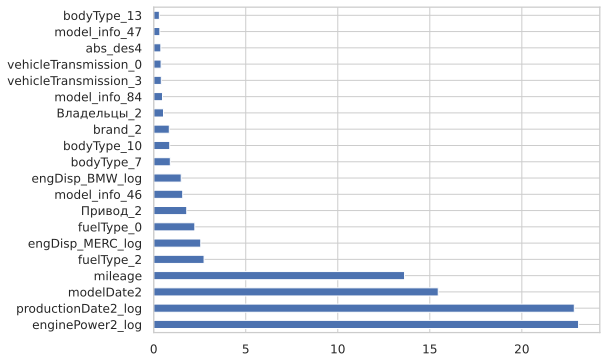

In [556]:
#значимость признаков
plt.rcParams['figure.figsize'] = (8,6)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')

Model 3: Tabular NN

In [557]:
#выберем признаки
categorical_features = [
    'bodyType',
    'brand',
    'color',
    'fuelType',
    'model_info',
    'vehicleTransmission',
    'ПТС',
    'Привод',
    'name3',
    'Владельцы',
]


numerical_features = [   
    'mileage',
    'engDisp_AUDI',
    'engDisp_MERC',
    'engDisp_BMW',
    'enginePower2',
    'modelDate2',
    'productionDate2',
]

bin_features = [
    '5G-TRONIC',
    'compact',
    'Extra',
    'BlueEFFICIENCY',
    'Long',
    'Package',
    'xDrive',
    'sDrive',
    'S ',
    'Brabus',
    'GT',
    'Edition',
    'Kompressor',
    '4MATIC',
    'All-Terrain',
    '9G-TRONIC',
    '4x4',
    'HYBRID',
    'L1',
    'L2',
    'L3',
    '5-speed',
    'TDI',
    'TFSI',
    'CDI',
    'BlueTEC',
    'AMG',
    '3month',
    '6month',
    'c_p_des1',
    'm_s_w_des2',
    'r_l_s_des3',
    'abs_des4',
    'c_c_des5',
    'a_w_des6',
    'r_v_c_des7',
    'intens_of_expl_out'
]

In [558]:
#Построим обычную сеть:

In [559]:
all_cols = numerical_features + bin_features + ['sample'] + ['price']
df_preproc = preproc_data(data, all_cols)

In [560]:
# Теперь выделим тестовую часть
train_data = df_preproc.query('sample == 1').drop(['sample'], axis=1)
test_data = df_preproc.query('sample == 0').drop(['sample'], axis=1)

y = train_data.price.values     # наш таргет
X = train_data.drop(['price'], axis=1)
X_sub = test_data.drop(['price'], axis=1)
y.shape, X.shape, X_sub.shape

((6506,), (6506, 390), (1671, 390))

In [561]:
X_columns = X.columns
scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)
X_sub = scaler.transform(X_sub)

In [562]:
X = pd.DataFrame(X, columns=X_columns)
X_sub = pd.DataFrame(X_sub, columns=X_columns)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=True, random_state=RANDOM_SEED)

In [563]:
num_neurons_l1 = 2*X.shape[1]
num_neurons_l2 = X.shape[1] 

In [564]:
K.clear_session()
model = Sequential()
model.add(L.Dense(num_neurons_l1, input_dim=X_train.shape[1], activation="relu"))
model.add(L.Dropout(0.7))
model.add(L.Dense(num_neurons_l2, activation="relu"))
model.add(L.Dropout(0.7))
model.add(L.Dense(1, activation="linear"))

In [565]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 780)               304980    
_________________________________________________________________
dropout (Dropout)            (None, 780)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 390)               304590    
_________________________________________________________________
dropout_1 (Dropout)          (None, 390)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 391       
Total params: 609,961
Trainable params: 609,961
Non-trainable params: 0
_________________________________________________________________


In [566]:
# Compile model
optimizer = tf.keras.optimizers.Adam(lr=0.004, amsgrad=True)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [567]:
checkpoint = ModelCheckpoint('../working/best_model.hdf5' , 
                             monitor=['val_MAPE'], 
                             verbose=0 , 
                             mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', 
                          patience=100, 
                          restore_best_weights=True, 
                          verbose=1)
callbacks_list = [checkpoint, earlystop]

In [568]:
#history = model.fit(X_train, y_train,
#                    batch_size=1024,
#                    epochs=2000, # фактически мы обучаем пока EarlyStopping не остановит обучение
#                    validation_data=(X_test, y_test),
#                    callbacks=callbacks_list,
#                    verbose=0,
#                   )

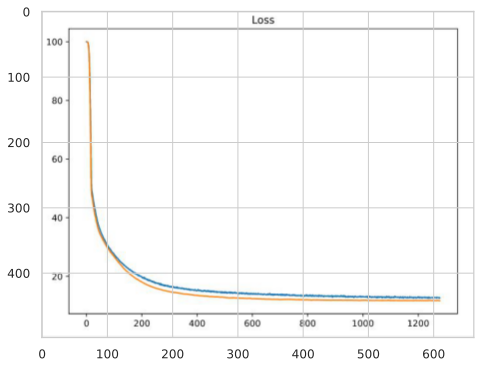

(662, 499)

In [569]:
#plt.title('Loss')
#plt.plot(history.history['MAPE'], label='train')
#plt.plot(history.history['val_MAPE'], label='test')
#plt.show();
import PIL
from PIL import ImageOps, ImageFilter
import matplotlib.pyplot as plt

image = PIL.Image.open('../input/1111111/1.JPG')
imgplot = plt.imshow(image)
plt.show()
image.size


In [570]:
model.load_weights('../working/best_model.hdf5')
model.save('../working/nn_1.hdf5')

In [571]:
test_predict_nn1 = model.predict(X_test)
print(f"TEST mape: {(mape(y_test, test_predict_nn1[:,0]))*100:0.2f}%")

TEST mape: 11.73%


In [572]:
sub_predict_nn1 = model.predict(X_sub)
sample_submission['price'] = sub_predict_nn1[:,0]
sample_submission.to_csv('nn1_submission.csv', index=False)

Model 4: NLP + Multiple Inputs

In [573]:
nltk.download('stopwords')
stopwords_list = stopwords.words("russian")
# Дополним список СТОП слов (можно добавить любые слова):
stopwords_list.extend(['0', '00', '01', '1', '10', '11', '13', '2', 
                  '2012', '2013', '2014', '2016', '2017', '2018', 
                  '25', '3', '30', '4', '40', '5', '50', '6', '60', '7', '72', '8', '9', 
                  'c', 'fi', 'i', 'in', 'm', 's', '·', 
                  'а', 'б', 'без', 'была', 'быть', 'в', 'в', 'вас', 'ваш', 'во', 
                  'возможна', 'вот', 'все', 'всех', 'вся', 'всё', 'вы', 'г', 'гк', 
                  'год', 'года', 'д', 'для', 'до', 'если', 'есть', 'еще', 'ещё', 'же', 
                  'за', 'и', 'ин', 'й', 'к', 'как', 'км', 'кто', 'л', 'лет', 'лицо', 
                  'м', 'мне', 'могу', 'можете', 'мы', 'на', 'нам', 'наш', 'не', 'ни', 
                  'о', 'ооо', 'от', 'оф', 'по', 'под', 'поехал', 'при', 'р', 'раз', 
                  'руб', 'рублей', 'ряд', 'с', 'себя', 'сел', 'т', 'там', 'тд', 
                  'ти', 'то', 'только', 'тыс', 'у', 'х', 'час', 'что', 'эл', 'это', 
                  'это', 'этого', 'я', 
                  '–', '—', '•', '∙', '●', '☑️', '☛', '✅', '✔', '➥'])

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [574]:
data

,bodyType,brand,color,description,fuelType,model_info,vehicleTransmission,Владельцы,ПТС,Привод,name2,name3,numberOfDoors,tax_cat,mileage_cat,productionDate2_cat,mileage,engineDisplacement2,engDisp_AUDI,engDisp_AUDI_log,engDisp_MERC,engDisp_MERC_log,engDisp_BMW,engDisp_BMW_log,enginePower2,enginePower2_log,modelDate2,productionDate2,productionDate2_log,count_words_d,mean_c_w,sum_c_w,tax,intens_of_expl,Train,sell_id,5G-TRONIC,compact,Extra,BlueEFFICIENCY,Long,Package,xDrive,sDrive,S,Brabus,GT,Edition,Kompressor,4MATIC,All-Terrain,9G-TRONIC,4x4,HYBRID,L1,L2,L3,5-speed,TDI,TFSI,CDI,BlueTEC,AMG,3month,6month,c_p_des1,m_s_w_des2,r_l_s_des3,abs_des4,c_c_des5,a_w_des6,r_v_c_des7,intens_of_expl_out,price,price_log,modelDate2_log,engineDisplacement2_log,sample
0,седан,BMW,чёрный,Авто на бодром ходу. Все работает отлично. П...,бензин,5ER,автоматическая,3.0,Оригинал,полный,empty,530xi,4,8,300,10,245000,0.389831,0.166667,0.317394,0.346939,0.535307,0.389831,0.648598,272,5.605802,13,14,2.639057,45,0.001210,45,40800,15312.500000,1,1099980990,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,599000.0,13.303017,2.564949,0.329182,1
1,седан,AUDI,серебристый,"Продажа от собственника, второй владелец, ПТС ...",бензин,A6,вариатор,2.0,Оригинал,передний,empty,2.8,4,6,300,10,183000,0.355932,0.333333,0.526456,0.346939,0.535307,0.355932,0.617849,204,5.318120,9,10,2.302585,57,0.001317,49,13260,15250.000000,1,1095836906,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,850000.0,13.652992,2.197225,0.304489,1
2,седан,MERCEDES,чёрный,Внимание! Только для клиентов AVILON Автомобил...,бензин,E_KLASSE,автоматическая,3.0,Оригинал,полный,empty,350,4,8,300,10,122733,0.474576,0.166667,0.317394,0.448980,0.633983,0.355932,0.617849,306,5.723585,11,8,2.079442,144,0.003441,128,45900,12273.300000,1,1100195530,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,1325000.0,14.096923,2.397895,0.388371,1
3,седан,AUDI,белый,В комплекте зимние колёса. 27.07.2020 Замена п...,бензин,A6,вариатор,3.0,Оригинал,передний,empty,2.0,4,5,300,10,151000,0.220339,0.166667,0.317394,0.346939,0.535307,0.355932,0.617849,180,5.192957,9,10,2.302585,33,0.000806,30,9900,12583.333333,1,1099880662,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,815000.0,13.610943,2.197225,0.199129,1
4,лифтбек,AUDI,белый,"Отличный авто, 2011 года выпуска, кроме передн...",бензин,A5,вариатор,3.0,Оригинал,передний,empty,1.8,5,4,300,10,140000,0.186441,0.125000,0.251930,0.346939,0.535307,0.355932,0.617849,160,5.075174,13,10,2.302585,166,0.003952,147,7200,11666.666667,1,1083244610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,810000.0,13.604790,2.564949,0.170958,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8172,седан,BMW,коричневый,Продаётся любимица семьи. Автомобилем неактивн...,бензин,3ER,автоматическая,2.0,Оригинал,задний,empty,320i,4,5,300,10,76000,0.220339,0.166667,0.317394,0.346939,0.535307,0.220339,0.467888,184,5.214936,9,9,2.197225,57,0.001398,52,10120,6909.090909,0,1099414488,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,0,0,0,0,0,NaN,NaN,2.197225,0.199129,0
8173,внедорожник 5 дв.,BMW,синий,"В продаже автомобиль от компании АО ABTODOM, о...",дизель,X5,автоматическая,1.0,Оригинал,полный,empty,25d,5,6,300,10,120381,0.389831,0.166667,0.317394,0.346939,0.535307,0.389831,0.648598,218,5.384495,7,4,1.386294,193,0.005376,200,14170,20063.500000,0,1099277058,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0,0,0,1,0,0,1,0,NaN,NaN,1.945910,0.329182,0
8174,внедорожник 5 дв.,AUDI,белый,Машина в идеальном техническом состоянии. Обсл...,бензин,Q3,роботизированная,2.0,Оригинал,передний,

In [576]:
def filter_str(st):
    # Фильтруем стоп-слова в Desrciption:
    split_str = st.split()
    filtered_str = ' '.join((filter(lambda s: s not in stopwords_list, split_str)))
    return filtered_str


data['description2'] = data['description'].apply(filter_str)

In [579]:
def preprocess_text(sen):
    sentence = sen

    #удаляем отдельные символы
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    #удаляем множественные пробелы
    sentence = re.sub(r'\s+', ' ',  sentence)

    return sentence
data['description3'] = data['description2'].apply(preprocess_text)

In [580]:
data['description2']=data['description3']

In [583]:
morph = pymorphy2.MorphAnalyzer()
#Морфологический анализ 
def filter_str(str):
  # лемматизации текста :
    split_str = str.split()
    filtered_str = ' '.join(
        (map(lambda x: morph.parse(x)[0].normal_form, split_str)))
    return filtered_str

#data['description2'] = data['description2'].apply(filter_str)

In [585]:
#data.to_csv('data.csv', index=False)

In [586]:
data = pd.read_csv('./data.csv')

In [589]:
data['description2']

0       авто бодрый ходу. всё работать отлично. по эле...
1       продажа собственника, второй владелец, птс ори...
2       внимание! только клиент avilon автомобиль проб...
3       в комплект зимний колёса. 27.07.2020 замена пе...
4       отличный авто, 2011 выпуска, кроме передний ле...
                              ...                        
8172    продаваться любимица семьи. автомобиль неактив...
8173    в продажа автомобиль компания ао abtodom, офиц...
8174    машина идеальный технический состоянии. обслуж...
8175    автомобиль приобретаться новый дилер avilon ок...
8176    id: 38887 комплектация-comfort год выпуск птс ...
Name: description2, Length: 8177, dtype: object

In [587]:
# словарь замен частых слов и выражений на коды
dict_replace = {
    'авто':['машина','тачилу','тачка','автомобиль'], 
    'состояние':['состоянии'],
    'дилер':['официальный дилера','оф. дилер','официальный дилер BMW', 'дилер avilon'], 
    'код0':['добрый день'],
    'код1':['хороший состояние','отличный состояние','идеальный состояние'],
    'код2':['а / м'],
    'код3':['автомобиль проходить комплексный'],
    'код4':['более 000 проверять авто пробег гарантия год ждать вы сайт rolf - probeg мобильный приложение мой рольф'],
    'код5':['ваш удобства'],
    'код6':['вентиляция задний сидение'],
    'код7':['все авто проходить'],
    'код8':['гарантия производитель'],
    'код9':['гаражный хранение'],
    'код10':['гарантия юридический чистота'],
    'код11':['доводчик дверей'],
    'код12':['датчик свет датчик дождь'],
    'код13':['камера задний вид"'],
    'код14':['Климат-контроль'],
    'код15':['круиз - контроль','климат - контроль'],
    'код16':['обмен ваш автомобиль'],
    'код17':['подогрев сидение водитель пассажир'],
    'код18':['подушка безопасность водитель'],
    'код19':['подушка безопасность пассажир'],
    'код20':['подушка безопасность'],
    'код21':['птс оригинал'],
    'код22':['рулевой колонка управление'],
    'код23':['сервисный книжка'],
    'код24':['система контроль слепой зона'],
    'код25':['система система курсовой устойчивость'],
    'код26':['широкий ассортимент'],
    'код27':['центральный замок'],
    'код28':['электрорегулировка сидение пассажир'],
    'код29':['avilon авто пробег'],
    'код30':['Mercedes - Benz'],
    
}


In [595]:
for elem in dict_replace:
    for word in dict_replace[elem]:
        data['description2'] = data['description2'].apply(lambda x: str(x).replace(word, elem))

In [597]:
data['description'] = data['description2']

In [598]:
# TOKENIZER
# The maximum number of words to be used. (most frequent)
MAX_WORDS = 100000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 256

In [599]:
# split данных
text_train = data.description.iloc[X_train.index]
text_test = data.description.iloc[X_test.index]
text_sub = data.description.iloc[X_sub.index]

In [600]:
%%time
tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

CPU times: user 1.09 s, sys: 364 µs, total: 1.09 s
Wall time: 1.09 s


In [603]:
#tokenize.word_index

In [602]:
%%time
text_train_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_train), maxlen=MAX_SEQUENCE_LENGTH)
text_test_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_test), maxlen=MAX_SEQUENCE_LENGTH)
text_sub_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_sub), maxlen=MAX_SEQUENCE_LENGTH)

print(text_train_sequences.shape, text_test_sequences.shape, text_sub_sequences.shape, )

(5530, 256) (976, 256) (1671, 256)
CPU times: user 1.1 s, sys: 2.5 ms, total: 1.1 s
Wall time: 1.1 s


In [604]:
# вот так теперь выглядит наш текст
print(text_train.iloc[6])
print(text_train_sequences[6])

безопасность: 8. мультимедиа: 4. обзор: 4. комфорт: 7. защита угона: 1. салон: 6.
[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0  

In [607]:
#RNN NLP
K.clear_session()
model_nlp = Sequential()
model_nlp.add(L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"))
model_nlp.add(L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,))
model_nlp.add(L.LSTM(2*MAX_SEQUENCE_LENGTH, return_sequences=True))
model_nlp.add(L.Dropout(0.6))
model_nlp.add(L.LSTM(MAX_SEQUENCE_LENGTH,))
model_nlp.add(L.Dropout(0.25))
model_nlp.add(L.Dense(MAX_SEQUENCE_LENGTH//2, activation="relu"))
model_nlp.add(L.Dropout(0.25))

In [609]:
#MLP
model_mlp = Sequential()
model_mlp.add(L.Dense(num_neurons_l1, input_dim=X_train.shape[1], activation="relu"))
model_mlp.add(L.Dropout(0.7))
model_mlp.add(L.Dense(num_neurons_l2, activation="relu"))
model_mlp.add(L.Dropout(0.7))

In [612]:
#Multiple Inputs NN
combinedInput = L.concatenate([model_nlp.output, model_mlp.output])
# being our regression head
head = L.Dense(64, activation="relu")(combinedInput)
head = L.Dense(1, activation="linear")(head)

model = Model(inputs=[model_nlp.input, model_mlp.input], outputs=head)

In [613]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
seq_description (InputLayer)    [(None, 256)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 256, 256)     7979776     seq_description[0][0]            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 256, 512)     1574912     embedding[0][0]                  
__________________________________________________________________________________________________
dropout (Dropout)               (None, 256, 512)     0           lstm[0][0]                       
_______________________________________________________________________________________

In [614]:
optimizer = tf.keras.optimizers.Adam(lr=0.006, amsgrad=True)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [615]:
checkpoint = ModelCheckpoint('../working/best_model.hdf5', 
                             monitor=['val_MAPE'], 
                             verbose=0, 
                             mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', 
                          patience=20, 
                          restore_best_weights=True, 
                          verbose=1)
callbacks_list = [checkpoint, earlystop]

In [620]:
#history = model.fit([text_train_sequences, X_train], y_train,
#                    batch_size=1024,
#                    epochs=600, # фактически мы обучаем пока EarlyStopping не остановит обучение
#                    validation_data=([text_test_sequences, X_test], y_test),
#                    callbacks=callbacks_list
#                   )

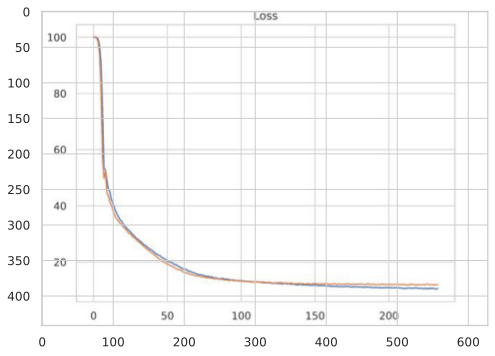

(628, 442)

In [621]:
#plt.title('Loss')
#plt.plot(history.history['MAPE'], label='train')
#plt.plot(history.history['val_MAPE'], label='test')
#plt.show();

image = PIL.Image.open('../input/222222/2.JPG')
imgplot = plt.imshow(image)
plt.show()
image.size

In [622]:
model.load_weights('../working/best_model.hdf5')
model.save('../working/nn_mlp_nlp.hdf5')

In [624]:
test_predict_nn2 = model.predict([text_test_sequences, X_test])
print(f"TEST mape: {(mape(y_test, test_predict_nn2[:,0]))*100:0.2f}%")

TEST mape: 12.04%


In [625]:
sub_predict_nn2 = model.predict([text_sub_sequences, X_sub])
sample_submission['price'] = sub_predict_nn2[:,0]
sample_submission.to_csv('nn2_submission.csv', index=False)

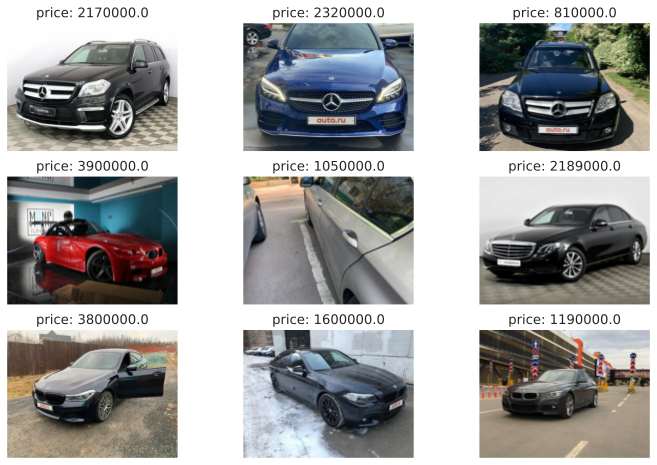

In [627]:
#Model 5: Добавляем картинки
# убедимся, что цены и фото подгрузились верно
plt.figure(figsize = (12,8))

random_image = train.sample(n = 9)
random_image_paths = random_image['sell_id'].values
random_image_cat = random_image['price'].values

for index, path in enumerate(random_image_paths):
    im = PIL.Image.open('../input/sf-dst-car-price-prediction-part2/img/img/' + str(path) + '.jpg')
    plt.subplot(3, 3, index + 1)
    plt.imshow(im)
    plt.title('price: ' + str(random_image_cat[index]))
    plt.axis('off')
plt.show()

In [631]:
size = (320, 240)

def get_image_array(index):
    images_train = []
    for index, sell_id in enumerate(data['sell_id'].iloc[index].values):
        image = cv2.imread('../input/sf-dst-car-price-prediction-part2/img/img/' + str(sell_id) + '.jpg')
        assert(image is not None)
        image = cv2.resize(image, size)
        images_train.append(image)
    images_train = np.array(images_train)
    print('images shape', images_train.shape, 'dtype', images_train.dtype)
    return(images_train)

images_train = get_image_array(X_train.index)
images_test = get_image_array(X_test.index)
images_sub = get_image_array(X_sub.index)

images shape (5530, 240, 320, 3) dtype uint8
images shape (976, 240, 320, 3) dtype uint8
images shape (1671, 240, 320, 3) dtype uint8


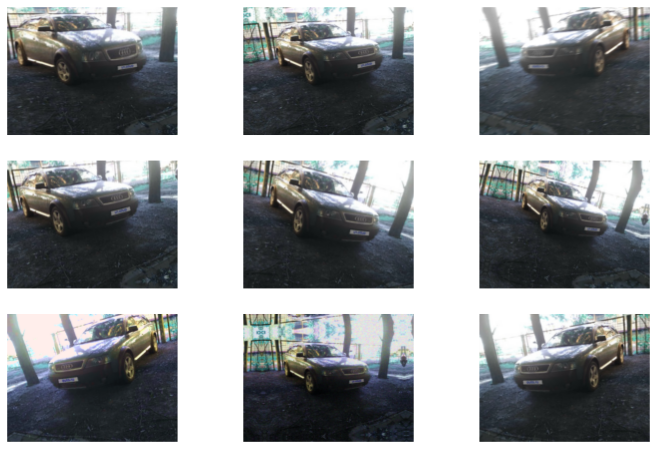

In [632]:
from albumentations import (
    HorizontalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose
)


#пример взят из официальной документации: https://albumentations.readthedocs.io/en/latest/examples.html
augmentation = Compose([
    HorizontalFlip(),
    OneOf([
        IAAAdditiveGaussianNoise(),
        GaussNoise(),
    ], p=0.2),
    OneOf([
        MotionBlur(p=0.2),
        MedianBlur(blur_limit=3, p=0.1),
        Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=1),
    OneOf([
        OpticalDistortion(p=0.3),
        GridDistortion(p=0.1),
        IAAPiecewiseAffine(p=0.3),
    ], p=0.2),
    OneOf([
        CLAHE(clip_limit=2),
        IAASharpen(),
        IAAEmboss(),
        RandomBrightnessContrast(),
    ], p=0.3),
    HueSaturationValue(p=0.3),
], p=1)

#пример
plt.figure(figsize = (12,8))
for i in range(9):
    img = augmentation(image = images_train[0])['image']
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

tf.data.Dataset

Если все изображения мы будем хранить в памяти, то может возникнуть проблема ее нехватки. Не храните все изображения в памяти целиком!

Метод .fit() модели keras может принимать либо данные в виде массивов или тензоров, либо разного рода итераторы, из которых наиболее современным и гибким является tf.data.Dataset. Он представляет собой конвейер, то есть мы указываем, откуда берем данные и какую цепочку преобразований с ними выполняем. Далее мы будем работать с tf.data.Dataset.

Dataset хранит информацию о конечном или бесконечном наборе кортежей (tuple) с данными и может возвращать эти наборы по очереди. Например, данными могут быть пары (input, target) для обучения нейросети. С данными можно осуществлять преобразования, которые осуществляются по мере необходимости (lazy evaluation).

tf.data.Dataset.from_tensor_slices(data) - создает датасет из данных, которые представляют собой либо массив, либо кортеж из массивов. Деление осуществляется по первому индексу каждого массива. Например, если data = (np.zeros((128, 256, 256)), np.zeros(128)), то датасет будет содержать 128 элементов, каждый из которых содержит один массив 256x256 и одно число.

dataset2 = dataset1.map(func) - применение функции к датасету; функция должна принимать столько аргументов, каков размер кортежа в датасете 1 и возвращать столько, сколько нужно иметь в датасете 2. Пусть, например, датасет содержит изображения и метки, а нам нужно создать датасет только из изображений, тогда мы напишем так: dataset2 = dataset.map(lambda img, label: img).

dataset2 = dataset1.batch(8) - группировка по батчам; если датасет 2 должен вернуть один элемент, то он берет из датасета 1 восемь элементов, склеивает их (нулевой индекс результата - номер элемента) и возвращает.

dataset.__iter__() - превращение датасета в итератор, из которого можно получать элементы методом .__next__(). Итератор, в отличие от самого датасета, хранит позицию текущего элемента. Можно также перебирать датасет циклом for.

dataset2 = dataset1.repeat(X) - датасет 2 будет повторять датасет 1 X раз.

Если нам нужно взять из датасета 1000 элементов и использовать их как тестовые, а остальные как обучающие, то мы напишем так:

test_dataset = dataset.take(1000) train_dataset = dataset.skip(1000)

Датасет по сути неизменен: такие операции, как map, batch, repeat, take, skip никак не затрагивают оригинальный датасет. Если датасет хранит элементы [1, 2, 3], то выполнив 3 раза подряд функцию dataset.take(1) мы получим 3 новых датасета, каждый из которых вернет число 1. Если же мы выполним функцию dataset.skip(1), мы получим датасет, возвращающий числа [2, 3], но исходный датасет все равно будет возвращать [1, 2, 3] каждый раз, когда мы его перебираем.

tf.Dataset всегда выполняется в graph-режиме (в противоположность eager-режиму), поэтому либо преобразования (.map()) должны содержать только tensorflow-функции, либо мы должны использовать tf.py_function в качестве обертки для функций, вызываемых в .map(). Подробнее можно прочитать здесь.

In [633]:
# NLP part
tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

In [635]:
def process_image(image):
    return augmentation(image = image.numpy())['image']

def tokenize_(descriptions):
    return sequence.pad_sequences(tokenize.texts_to_sequences(descriptions), maxlen = MAX_SEQUENCE_LENGTH)

def tokenize_text(text):
    return tokenize_([text.numpy().decode('utf-8')])[0]

def tf_process_train_dataset_element(image, table_data, text, price):
    im_shape = image.shape
    [image,] = tf.py_function(process_image, [image], [tf.uint8])
    image.set_shape(im_shape)
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

def tf_process_val_dataset_element(image, table_data, text, price):
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

train_dataset = tf.data.Dataset.from_tensor_slices((
    images_train, X_train, data.description.iloc[X_train.index], y_train
    )).map(tf_process_train_dataset_element)

test_dataset = tf.data.Dataset.from_tensor_slices((
    images_test, X_test, data.description.iloc[X_test.index], y_test
    )).map(tf_process_val_dataset_element)

y_sub = np.zeros(len(X_sub))
sub_dataset = tf.data.Dataset.from_tensor_slices((
    images_sub, X_sub, data.description.iloc[X_sub.index], y_sub
    )).map(tf_process_val_dataset_element)

#проверяем, что нет ошибок (не будет выброшено исключение):
train_dataset.__iter__().__next__();
test_dataset.__iter__().__next__();
sub_dataset.__iter__().__next__();

In [636]:
#cскачаем предобученную сеть
K.clear_session()
#нормализация включена в состав модели EfficientNetB3, поэтому на вход она принимает данные типа uint8
efficientnet_model = tf.keras.applications.efficientnet.EfficientNetB3(weights = 'imagenet', include_top = False, input_shape = (size[1], size[0], 3))
efficientnet_output = L.GlobalAveragePooling2D()(efficientnet_model.output)

43941888/43941136 [==============================] - 1s 0us/step


In [637]:
#строим нейросеть для анализа табличных данных
tabular_model = Sequential([
    L.Input(shape = X.shape[1]),
    L.Dense(num_neurons_l1, activation = 'relu'),
    L.Dropout(0.7),
    L.Dense(num_neurons_l2, activation = 'relu'),
    L.Dropout(0.7),
    ])

In [638]:
# NLP
nlp_model = Sequential([
    L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"),
    L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,),
    L.LSTM(2*MAX_SEQUENCE_LENGTH, return_sequences=True),
    L.Dropout(0.5),
    L.LSTM(MAX_SEQUENCE_LENGTH),
    L.Dropout(0.25),
    L.Dense(MAX_SEQUENCE_LENGTH//2),
    ])

In [639]:
#объединяем выходы трех нейросетей
combinedInput = L.concatenate([efficientnet_output, tabular_model.output, nlp_model.output])

# being our regression head
head = L.Dense(256, activation="relu")(combinedInput)
head = L.Dense(1,)(head)

model = Model(inputs=[efficientnet_model.input, tabular_model.input, nlp_model.input], outputs=head)
#model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 240, 320, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 240, 320, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 240, 320, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 241, 321, 3)  0           normalization[0][0]              
_______________________________________________________________________________________

In [640]:
optimizer = tf.keras.optimizers.Adam(lr=0.006, amsgrad=True)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [642]:
checkpoint = ModelCheckpoint('../working/best_model2.hdf5', monitor=['val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=10, restore_best_weights=True, verbose=1)
callbacks_list = [checkpoint, earlystop]

In [649]:
#history = model.fit(train_dataset.batch(30),
#                    epochs=100,
#                    validation_data = test_dataset.batch(30),
#                    callbacks=callbacks_list
#                   )

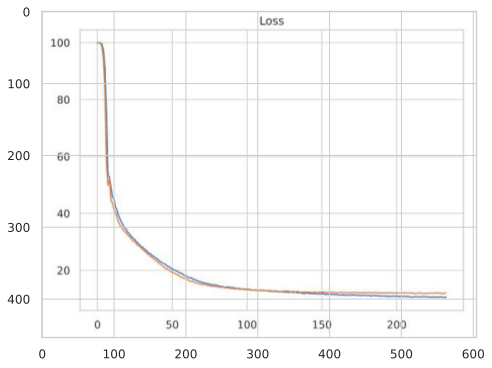

(605, 454)

In [672]:
#plt.title('Loss')
#plt.plot(history.history['MAPE'], label='train')
#plt.plot(history.history['val_MAPE'], label='test')
#plt.show();

image = PIL.Image.open('../input/333333/3.JPG')
imgplot = plt.imshow(image)
plt.show()
image.size

In [651]:
model.load_weights('../working/best_model2.hdf5')
model.save('../working/nn_final.hdf5')

In [652]:
test_predict_nn3 = model.predict(test_dataset.batch(30))
print(f"TEST mape: {(mape(y_test, test_predict_nn3[:,0]))*100:0.2f}%")

TEST mape: 12.15%


In [653]:
sub_predict_nn3 = model.predict(sub_dataset.batch(30))
sample_submission['price'] = sub_predict_nn3[:,0]
sample_submission.to_csv('nn3_submission.csv', index=False)

In [654]:
#Blend
blend_predict = (test_predict_catboost + test_predict_nn2[:,0]) / 2
print(f"TEST mape: {(mape(y_test, blend_predict))*100:0.2f}%")

TEST mape: 10.93%


In [655]:
blend_sub_predict = (sub_predict_catboost + sub_predict_nn2[:,0]) / 2
sample_submission['price'] = blend_sub_predict
sample_submission.to_csv('blend_submission.csv', index=False)

In [656]:
#Model Bonus: проброс признака
K.clear_session()
# MLP
model_mlp = Sequential()
model_mlp.add(L.Dense(num_neurons_l1, input_dim=X_train.shape[1], activation="relu"))
model_mlp.add(L.Dropout(0.7))
model_mlp.add(L.Dense(num_neurons_l2, activation="relu"))
model_mlp.add(L.Dropout(0.7))

In [657]:
# FEATURE Input
# Iput
productiondate = L.Input(shape=[1], name="productionDate2")
# Embeddings layers
emb_productiondate = L.Embedding(len(X.productionDate2.unique().tolist())+1, 20)(productiondate)
f_productiondate = L.Flatten()(emb_productiondate)

In [658]:
combinedInput = L.concatenate([model_mlp.output, f_productiondate,])
# being our regression head
head = L.Dense(64, activation="relu")(combinedInput)
head = L.Dense(1, activation="linear")(head)

model = Model(inputs=[model_mlp.input, productiondate], outputs=head)

In [659]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
dense_input (InputLayer)        [(None, 390)]        0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 780)          304980      dense_input[0][0]                
__________________________________________________________________________________________________
dropout (Dropout)               (None, 780)          0           dense[0][0]                      
__________________________________________________________________________________________________
productionDate2 (InputLayer)    [(None, 1)]          0                                            
_______________________________________________________________________________________

In [660]:
optimizer = tf.keras.optimizers.Adam(lr=0.006, amsgrad=True)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [668]:
#history = model.fit([X_train, X_train.productionDate2.values], y_train,
#                    batch_size=1024,
#                    epochs=500, # фактически мы обучаем пока EarlyStopping не остановит обучение
#                    validation_data=([X_test, X_test.productionDate2.values], y_test),
#                    callbacks=callbacks_list
#                   )

In [665]:
model.load_weights('../working/best_model2.hdf5')
test_predict_nn_bonus = model.predict([X_test, X_test.productionDate2.values])
print(f"TEST mape: {(mape(y_test, test_predict_nn_bonus[:,0]))*100:0.2f}%")

TEST mape: 12.36%


In [666]:
#Model: Blending с весами и поиск оптимума

In [667]:
test_predict_catboost.shape, test_predict_nn1.shape, test_predict_nn2.shape, test_predict_nn3.shape

((976,), (976, 1), (976, 1), (976, 1))

In [669]:
min_MAPE = 100.0
N = 20
c = round(1/N,3)
opti_c = []
for i in range(N):
    lc1 = round(1 - c*i,2)
    for j in range(N-i):
        lc2 = round(lc1- c*j,2)
        for k in range (N-i-j):
            lc3 = round(lc2- c*k,2)
            c1 = c*i
            c2 = c*j
            c3 = c*k
            blend_predict = (c1*test_predict_catboost \
                           + c2*test_predict_nn1[:,0] \
                           + c3*test_predict_nn2[:,0] \
                           + lc3*test_predict_nn3[:,0] )
            temp_mape = mape(y_test, blend_predict)*100
            if temp_mape<min_MAPE:
                min_MAPE = temp_mape
                opti_c = [c1,c2,c3,lc3]
print(min_MAPE, opti_c)

10.716914603294637 [0.65, 0.30000000000000004, 0.0, 0.05]


In [670]:
sub_predict_catboost.shape, sub_predict_nn1.shape, sub_predict_nn2.shape, sub_predict_nn3.shape

((1671,), (1671, 1), (1671, 1), (1671, 1))

In [671]:
c1 = opti_c[0]
c2 = opti_c[1]
c3 = opti_c[2]
lc3 = opti_c[3]
blend_sub_predict = (c1*sub_predict_catboost \
                   + c2*sub_predict_nn1[:,0] \
                   + c3*sub_predict_nn2[:,0] \
                   + lc3*sub_predict_nn3[:,0])
    
sample_submission['price'] = blend_sub_predict
sample_submission.to_csv('blend_submission2.csv', index=False)